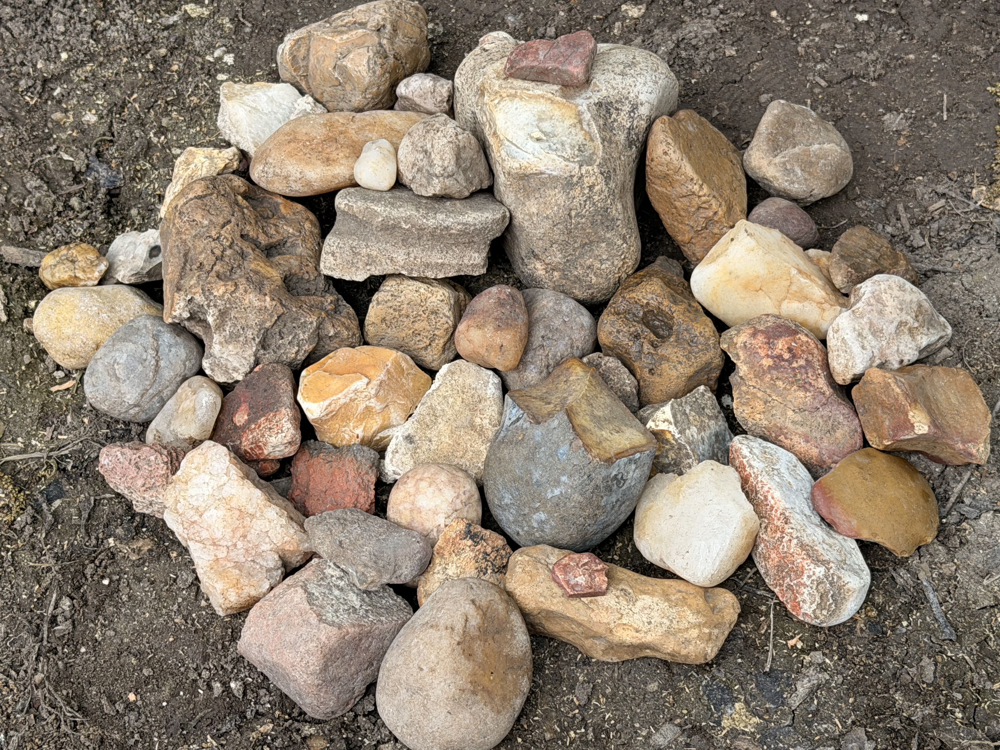

In [1]:
from IPython.display import Image, display

display(Image('rocks.jpeg', width=800))

# Rocks, Soil, and Deep Time: Understanding Local Geology Through Public Data

## Background and Motivation

When digging in my backyard in Central Texas, I started noticing an odd mix of materials — soft white chalky chunks, dark glassy fragments with waxy surfaces, smooth rounded pebbles in shades of pink and red, rough angular dark gray pieces, and irregular white nodules, sometimes all in the same shovelful. The variety was striking not just in quantity but in color, texture, and hardness. Some rocks crumble when struck, others ring like flint. This got me curious: what am I actually looking at, and why is there so much variety?

It turns out my neighborhood sits at or near the contact zone between two geological formations deposited in an ancient shallow inland sea that covered Central Texas roughly 70-90 million years ago:

- **Austin Chalk** — a creamy white limestone formation high in calcium carbonate and alkaline. The soft white chalky fragments, caliche nodules, and dark glassy chert and flint pieces all trace back to this formation. Chert forms when silica-rich water percolates through cavities in the limestone, perhaps explaining the geodes.

- **Taylor Marl** — a darker, clay-rich formation deposited as conditions in the same sea shifted from carbonate to siliciclastic. The dark gray and brownish angular fragments, and the sticky expansive clay that makes Central Austin gardens so challenging, come from here.

Being at the contact zone explains part of the variety — material from both formations shows up when you dig. But there is a third source that cannot be explained by local geology alone: the pink and red crystalline rocks that look and feel like granite. These are likely derived from the Llano Uplift — ancient Precambrian igneous and metamorphic formations over a billion years old exposed in the Hill Country west of Austin, which was used to build the beautiful Texas Capitol building.

The soil surrounding all of these rocks tells the same story. Soils high in calcium carbonate and pH formed from or over limestone. Soils dominated by expansive clay formed from marl. Soil chemistry can serve as a proxy for the geology underneath, which is exactly what this project sets out to explore using two publicly available datasets: the USDA SSURGO soil survey database and the Macrostrat geological formation database.

## Questions I Want to Answer

My original question was about rocks — what are they, where do they come from, and why so much variety? I used the following two publicly available datasets to help answer it:

- **USDA SSURGO** — the most detailed soil survey database available for the United States, queryable via REST API. Soil data doesn't describe rocks directly, but it measures properties that reflect the underlying geology. pH, calcium carbonate, texture, and depth profiles are proxies for the formations underneath.

- **Macrostrat** — a geological formation database queryable via REST API that provides direct descriptions of the rock units underlying an area, including their age, lithology, and depositional environment.

Together these two sources allow the rock question to be approached from both directions: soil chemistry as a proxy for geology, and geological formation data as direct context for what the soil is telling us.

These two datasets together support four related questions:

1. **Does depth predict soil pH and calcium carbonate content?**  
   If the Austin Chalk formation dominates near the surface, we'd expect pH and calcium carbonate to be high near the surface and change as we go deeper into the Taylor Marl.

2. **Can we predict pH from measurable soil properties?**  
   Which physical properties are most strongly associated with acidity or alkalinity, and do those properties reflect the limestone vs. clay geology?

3. **Do soil properties cluster into distinct groups that correspond to the underlying geology?**  
   If Austin Chalk and Taylor Marl have genuinely different physical signatures, we should be able to see that in the data.

4. **Can we predict which geological formation a soil horizon belongs to from its measurable properties?**  
  If soil chemistry reliably reflects the underlying geology, we should be able to classify horizons as Austin Chalk, Taylor Marl, or other formations based on measurements alone.

## Why This Matters

This project combines soil survey data, geological formation data, and direct observation to build as complete a picture as possible of what's happening (or rather, happened) underground.  Can a hand-digger full of Central Texas dirt truly contain the remnants of an ancient sea, a billion-year-old mountain range, and everything in between?

## Data Sources

### SSURGO: Soil Survey Geographic Database
The soil data in this project was obtained from the **USDA Natural Resources Conservation Service (NRCS) Soil Data Access (SDA)** web service, which provides programmatic access to the SSURGO (Soil Survey Geographic Database) — the most detailed soil survey data available for the United States.  To interact with it online:  https://websoilsurvey.sc.egov.usda.gov/app/WebSoilSurvey.aspx

Rather than downloading the full gSSURGO geodatabase (which exceeds 5 GB for Texas),
the data was queried directly from USDA's servers using their REST API endpoint:
https://SDMDataAccess.sc.egov.usda.gov/Tabular/post.rest

The query filtered results to **Travis County, Texas** using the SSURGO area symbol
`TX453`, and joined three core tables:

- `mapunit` — the geographic soil map units
- `component` — the soil components within each map unit (soil series names,
   drainage class, taxonomic classification)
- `chorizon` — the measured properties at each soil depth horizon
   (clay %, sand %, pH, organic matter, calcium carbonate %)

The result is one row per soil horizon per component, covering depth profiles from the surface down through the subsoil across Travis County.  Notably, one of the most common soil components in the dataset is literally named "Austin," which is a soil series named after the Austin Chalk formation, the same limestone formation visible as rock fragments in my backyard.

**Citation:** USDA Natural Resources Conservation Service. Soil Survey Geographic Database (SSURGO). Accessed via Soil Data Access
web service, 2024. https://sdmdataaccess.sc.egov.usda.gov

This dataset contains 384 rows, one per soil horizon (depth layer), covering soil profiles across Travis County pulled from the USDA SSURGO database.

### Macrostrat: Geological Formation Database

Geological formation data was obtained from **Macrostrat**
(https://macrostrat.org), a platform for the aggregation and distribution
of geological data relevant to the spatial and temporal distribution of
sedimentary, igneous, and metamorphic rocks. Macrostrat organizes geological
data into regional "columns" representing geographic areas with a consistent stratigraphic
record. Each column contains a set of rock units describing the geology of that area, including age, 
lithology, depositional environment, and thickness.

Data was queried via the Macrostrat REST API endpoint https://macrostrat.org/api/v2 for two geological columns
relevant to this area:

- **San Marcos Arch (col_id 519)** — the nearest stratigraphic column to the study area, containing the local Cretaceous formations including Austin Chalk, Taylor Marl, and Eagle Ford. This column provided the geological context for the soil chemistry patterns observed in the SSURGO data.

- **Llano Uplift (col_id 163)** — an ancient Precambrian column containing the igneous and metamorphic formations of the Texas Hill Country, including Town Mountain Granite and associated gneiss and schist units. This column provided context for the pink and red crystalline rocks found in the area that cannot be explained by local Cretaceous geology.

The API returns data in JSON format. Each record represents one geological unit and includes formation name, age range (t_age and b_age in millions of years), lithology descriptions, depositional environment, and outcrop status. Lithology is returned as a structured list allowing extraction of dominant rock type and rock clas (sedimentary, igneous, metamorphic).

**Citation:** Peters, S.E., Husson, J.M., and Czaplewski, J. 2018.
Macrostrat: A Platform for Geological Data Integration and Deep-Time Earth Crust Research. Geochemistry, Geophysics, Geosystems, 19, 1393-1409. https://macrostrat.org
Full API documentation is available at: https://macrostrat.org/api.

Together the two columns contain 101 geological units spanning from recent surface deposits to rocks over 1.2 billion years old.

### Data Dictionary

The SSURGO dataset was assembled by joining three SSURGO tables. Here is what each column means:

#### From the `mapunit` table — the geographic soil map unit
| Column | Description |
|--------|-------------|
| `muname` | Map unit name — a human-readable label like "Crawford clay, 1 to 3 percent slopes." Encodes the dominant soil series, texture, and slope range. |
| `mukey` | Unique numeric ID for the map unit. Used for joining tables, not for analysis. |

#### From the `component` table — the soil series within each map unit
| Column | Description |
|--------|-------------|
| `compname` | Component name — the soil series name, e.g. "Crawford" or "Austin." A soil series is a named, classified soil type with consistent properties. |
| `comppct_r` | The percentage of the map unit this component occupies. A map unit can contain multiple soil types; this tells you how dominant each one is. |
| `drainagecl` | Drainage class — describes how quickly water moves through the soil. Categories include "Well drained," "Moderately well drained," "Somewhat poorly drained," etc. |
| `taxorder` | Soil taxonomic order — the highest level of the USDA soil classification system. "Mollisols" are dark, fertile soils. "Vertisols" are shrink-swell clays. |
| `taxsubgrp` | Soil taxonomic subgroup — a more specific classification within the order. Encodes information about the soil's behavior and parent material. |

#### From the `chorizon` table — measured properties at each depth layer
| Column | Description |
|--------|-------------|
| `depth_top_cm` | Depth to the top of this horizon in centimeters, measured from the surface. A value of 0 means the surface layer. |
| `depth_bot_cm` | Depth to the bottom of this horizon in centimeters. The difference between bottom and top gives you the thickness of that layer. |
| `hzname` | Horizon name — a shorthand code like "A," "Bk," "Ck" that describes the horizon type. "A" is the topsoil. "B" is the subsoil. "k" means calcium carbonate accumulation is present. "C" means parent material (rock). |
| `clay_pct` | Percentage of the soil that is clay-sized particles (< 0.002 mm). High clay content means slow drainage and shrink-swell behavior. |
| `sand_pct` | Percentage of the soil that is sand-sized particles (0.05–2 mm). High sand means fast drainage. |
| `silt_pct` | Percentage of the soil that is silt-sized particles (0.002–0.05 mm). Silt is between sand and clay in size and behavior. |
| `organic_matter` | Percentage of the soil that is organic material — decomposed plant and animal matter. Higher values indicate more fertile, darker soils. |
| `pH` | Soil acidity or alkalinity on a 0–14 scale. 7 is neutral. Austin soils typically range from 7.5 to 8.5 (alkaline) due to limestone parent material. |
| `calcium_carbonate_pct` | Percentage of calcium carbonate (CaCO3) in the soil. High values indicate limestone parent material or caliche accumulation. This is the most direct geological signal in the dataset — Austin Chalk and caliche layers will show very high values. |

### Soil Data Value Comprehension
In order to make any sense of many of the values in this dataset, the [USDA Soil Survey Manual](https://https://www.nrcs.usda.gov/resources/guides-and-instructions/soil-survey-manual) (SSM) is absolutely indispensable. Any contextual information I needed to guide my observations related to soil component, taxonomy, horizon values etc. I found in the SSM.

The basic idea of how the data structured is this:  each row represents a soil horizon — a distinct layer at a specific depth within a specific soil component within a map unit.
So the hierarchy goes:

    Map unit (muname) — a geographic area on the map
    --> Component (compname) — a soil series within that map unit
        --> Horizon (hzname) — a distinct layer at a specific depth within that component

Each map unit can have varying numbers of components and horizons.

### From Macrostrat — geological formation data
| Column | Description |
|--------|-------------|
| `unit_name` | Name of the geological unit, e.g. "Austin Chalk" or "Town Mountain Granite" |
| `Fm` | Formation name — the formal stratigraphic name of the unit |
| `Gp` | Group name — the broader stratigraphic group the unit belongs to |
| `t_age` | Top age — the younger boundary of the unit in millions of years ago (Ma) |
| `b_age` | Bottom age — the older boundary of the unit in millions of years ago (Ma) |
| `max_thick` | Maximum thickness of the unit in meters |
| `min_thick` | Minimum thickness of the unit in meters |
| `outcrop` | Whether the unit is exposed at the surface ("surface"), only found underground ("subsurface"), or both ("both") |
| `lith` | Lithology — a structured list of rock types present in the unit, with proportions and attributes |
| `primary_lith` | Derived column — the dominant rock type extracted from the lith field |
| `rock_class` | Derived column — the dominant rock class: sedimentary, igneous, or metamorphic |

## Import Libraries

In [2]:
import sys
print(f"Python version: {sys.version}")

Python version: 3.8.7 (default, Jan 25 2021, 11:14:52) 
[GCC 5.5.0 20171010]


In [3]:
import requests
import pandas as pd
import numpy as np
import ast
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import LabelEncoder

## Load and Verify Data

### SSURGO Data

In [4]:
# Read in file:
df = pd.read_csv('travis_county_soils.csv')
print(f"Saved {df.shape[0]} rows and {df.shape[1]} columns")
df.head()

Saved 384 rows and 16 columns


,muname,mukey,compname,comppct_r,drainagecl,taxorder,taxsubgrp,depth_top_cm,depth_bot_cm,hzname,clay_pct,sand_pct,silt_pct,organic_matter,pH,calcium_carbonate_pct
0,"Altoga silty clay, 1 to 3 percent slopes",392154,Altoga,95,Well drained,Inceptisols,Udic Haplustepts,0,13,Ap,45.0,7.0,48.0,1.30,8.2,50.0
1,"Altoga silty clay, 1 to 3 percent slopes",392154,Altoga,95,Well drained,Inceptisols,Udic Haplustepts,13,102,Bk,40.0,8.0,52.0,0.80,8.2,58.0
2,"Altoga silty clay, 1 to 3 percent slopes",392154,Altoga,95,Well drained,Inceptisols,Udic Haplustepts,102,203,C,38.0,8.0,54.0,0.80,8.2,58.0
3,"Altoga silty clay, 3 to 6 percent slopes, mode...",392155,Altoga,95,Well drained,Inceptisols,Udic Ustochrepts,0,13,H1,45.0,7.2,47.8,1.25,8.2,50.0
4,"Altoga silty clay, 3 to 6 percent slopes, mode...",392155,Altoga,95,Well drained,Inceptisols,Udic Ustochrepts,13,61,H2,39.0,7.4,53.6,0.75,8.2,58.0


In [5]:
print(df.shape)
print("\nColumn names:")
print(df.columns.tolist())

print("\nMissing values:",df.isna().any(axis=1).sum())
print(df.isnull().sum())

print("\nBasic stats:")
df.describe()

(384, 16)

Column names:
['muname', 'mukey', 'compname', 'comppct_r', 'drainagecl', 'taxorder', 'taxsubgrp', 'depth_top_cm', 'depth_bot_cm', 'hzname', 'clay_pct', 'sand_pct', 'silt_pct', 'organic_matter', 'pH', 'calcium_carbonate_pct']

Missing values: 70
muname                    0
mukey                     0
compname                  0
comppct_r                 0
drainagecl               23
taxorder                 24
taxsubgrp                24
depth_top_cm              0
depth_bot_cm              0
hzname                    0
clay_pct                 69
sand_pct                 69
silt_pct                 70
organic_matter           69
pH                       66
calcium_carbonate_pct    66
dtype: int64

Basic stats:


,mukey,comppct_r,depth_top_cm,depth_bot_cm,clay_pct,sand_pct,silt_pct,organic_matter,pH,calcium_carbonate_pct
count,384.000000,384.000000,384.000000,384.000000,315.000000,315.000000,314.000000,315.000000,318.000000,318.000000
mean,392795.252604,69.984375,41.903646,92.494792,38.130159,27.665714,34.297134,1.357143,7.786792,21.044025
std,514.500809,28.453063,47.896304,62.278872,13.731173,21.000102,14.391150,1.102706,0.594413,22.590678
min,392154.000000,2.000000,0.000000,8.000000,5.000000,1.000000,0.000000,0.200000,5.600000,0.000000
25%,392177.000000,47.000000,0.000000,36.000000,30.000000,13.500000,27.900000,0.500000,7.600000,3.000000
50%,393208.000000,85.000000,20.000000,86.500000,42.500000,22.000000,29.500000,0.800000,8.000000,10.000000
75%,393239.250000,95.000000,63.000000,144.500000,50.000000,32.000000,47.000000,2.000000,8.200000,37.000000
max,393265.000000,100.000000,183.000000,251.000000,70.000000,91.700000,68.900000,6.000000,8.200000,80.000000


In [6]:
# Check column data types:
df.dtypes

muname                    object
mukey                      int64
compname                  object
comppct_r                  int64
drainagecl                object
taxorder                  object
taxsubgrp                 object
depth_top_cm               int64
depth_bot_cm               int64
hzname                    object
clay_pct                 float64
sand_pct                 float64
silt_pct                 float64
organic_matter           float64
pH                       float64
calcium_carbonate_pct    float64
dtype: object

In [7]:
display("Map Unit Overview:",
df.groupby('muname').size().describe(),
        df.groupby(['muname','compname'])['hzname'].unique()
)

'Map Unit Overview:'

count    97.000000
mean      3.958763
std       2.035710
min       1.000000
25%       3.000000
50%       4.000000
75%       4.000000
max      17.000000
dtype: float64

muname                                                                    compname   
Altoga silty clay, 1 to 3 percent slopes                                  Altoga                               [Ap, Bk, C]
Altoga silty clay, 3 to 6 percent slopes, moderately eroded               Altoga                              [H1, H2, H3]
Altoga soils and Urban land, 2 to 8 percent slopes                        Altoga                              [H1, H2, H3]
                                                                          Urban land                                  [H1]
Austin silty clay, 1 to 3 percent slopes                                  Austin                          [Ap, Bw, Bk, Cr]
                                                                                                       ...                
Whitewright clay loam, 1 to 5 percent slopes                              Whitewright                         [H1, H2, H3]
Wilson clay loam, 0 to 1 percent slopes              

#### SSURGO Data Observations
* 384 rows total
* 97 unique map unit names with an average of ~4 rows each (minimum of 1 row, maximum of 17)
* The map unit and component information is primarily categorical (muname, mukey, compname, drainagecl, taxorder, taxsubgrp, as well as hzname)
* quantitative data is comprised mostly of horizon data (depth_top_cm, depth_bot_cm, clay_pct, sand_pct, silt_pct, organic_matter, pH, calcium_carbonate_pct, as well as comppct_r)
* 70 rows with missing data with what appears to be clustered between two groups (those missing drainage class, taxonomy classification, and those missing horizon measurements)

### Macrostrat Data

In [8]:
# ── Load Macrostrat Geological Formation Data ──────────────────────────
# Load pre-saved CSV files for two geological columns relevant to this area.
# San Marcos Arch: local Cretaceous formations (Austin Chalk, Taylor Marl)
# Llano Uplift: ancient Precambrian igneous and metamorphic formations

df_sma = pd.read_csv('macrostrat_san_marcos_arch.csv')
df_llano = pd.read_csv('macrostrat_llano_uplift.csv')

print(f"San Marcos Arch: {len(df_sma)} rows and {df_sma.shape[1]} columns")
print(f"Llano Uplift: {len(df_llano)} rows and {df_llano.shape[1]} columns")

print("\nColumn names:")
print(df_sma.columns.tolist())

print("\nSan Marcos Arch — first few rows:")
df_sma.head()

San Marcos Arch: 56 rows and 43 columns
Llano Uplift: 45 rows and 43 columns

Column names:
['unit_id', 'section_id', 'col_id', 'project_id', 'col_area', 'unit_name', 'strat_name_id', 'Mbr', 'Fm', 'Gp', 'SGp', 't_age', 'b_age', 'max_thick', 'min_thick', 'outcrop', 'pbdb_collections', 'pbdb_occurrences', 'lith', 'environ', 'econ', 'measure', 'notes', 'color', 'text_color', 't_int_id', 't_int_name', 't_int_age', 't_prop', 'units_above', 'b_int_id', 'b_int_name', 'b_int_age', 'b_prop', 'units_below', 'strat_name_long', 'refs', 'clat', 'clng', 't_plat', 't_plng', 'b_plat', 'b_plng']

San Marcos Arch — first few rows:


,unit_id,section_id,col_id,project_id,col_area,unit_name,strat_name_id,Mbr,Fm,Gp,...,b_prop,units_below,strat_name_long,refs,clat,clng,t_plat,t_plng,b_plat,b_plng
0,16302,4276,519,1,52922.238,Unnamed,NaN,NaN,NaN,NaN,...,0.00,[0],NaN,[1],29.44,-97.925,29.440,-97.925,29.443,-97.921
1,16303,4277,519,1,52922.238,Lagarto Fm,1081.0,NaN,Lagarto,NaN,...,0.00,[16304],Lagarto Formation,[1],29.44,-97.925,30.643,-96.044,31.961,-93.705
2,16304,4277,519,1,52922.238,Oakville Fm,1450.0,NaN,Oakville,NaN,...,0.00,[16305],Oakville Formation,[1],29.44,-97.925,31.961,-93.705,32.728,-91.896
3,16305,4277,519,1,52922.238,Catahoula Tuff,4565.0,NaN,Catahoula Tuff,NaN,...,0.25,[16306],Catahoula Tuff,[1],29.44,-97.925,32.728,-91.896,33.635,-89.195
4,16306,4277,519,1,52922.238,Frio Fm,711.0,NaN,Frio,Catahoula,...,0.50,[16307],Frio Formation,[1],29.44,-97.925,33.635,-89.195,34.262,-85.607


In [9]:
print("=== Llano Uplift ===")
print(f"{df_llano.shape[0]} rows and {df_llano.shape[1]} columns")
print("\nFirst few rows:")
df_llano.head()

=== Llano Uplift ===
45 rows and 43 columns

First few rows:


,unit_id,section_id,col_id,project_id,col_area,unit_name,strat_name_id,Mbr,Fm,Gp,...,b_prop,units_below,strat_name_long,refs,clat,clng,t_plat,t_plng,b_plat,b_plng
0,5464,1288,163,1,20869.578,Unnamed,NaN,NaN,NaN,NaN,...,0.00,[5465],NaN,[1],31.133,-98.741,31.133,-98.741,31.136,-98.737
1,5465,1288,163,1,20869.578,Terrace Deposits,NaN,NaN,NaN,NaN,...,0.00,[0],NaN,[1],31.133,-98.741,31.136,-98.737,31.731,-97.820
2,5710,1334,163,1,20869.578,Segovia Fm,1858.0,NaN,Segovia,Edwards,...,0.75,[5711],Segovia Formation,[1],31.133,-98.741,36.722,-56.042,36.974,-53.672
3,5711,1334,163,1,20869.578,Fort Terrett Fm,690.0,NaN,Fort Terrett,Edwards,...,0.00,[5712],Fort Terrett Formation,[1],31.133,-98.741,36.974,-53.672,36.451,-45.749
4,5712,1334,163,1,20869.578,Trinity Gp,2677.0,NaN,NaN,Trinity,...,0.00,[0],Trinity Group,[1],31.133,-98.741,36.451,-45.749,32.316,-38.546


In [10]:
# Display dtypes for both datasets side by side
pd.DataFrame({
    'San Marcos Arch': df_sma.dtypes,
    'Llano Uplift': df_llano.dtypes
})

,San Marcos Arch,Llano Uplift
unit_id,int64,int64
section_id,int64,int64
col_id,int64,int64
project_id,int64,int64
col_area,float64,float64
unit_name,object,object
strat_name_id,float64,float64
Mbr,object,float64
Fm,object,object
Gp,object,object


In [11]:
# ── Parse Lithology Column ─────────────────────────────────────────────
# The lith column is stored as a JSON-like string containing a list of
# rock types with proportions and attributes for each geological unit.
# Example: [{'lith_id': 92, 'name': 'chalk', 'type': 'carbonate',
#            'class': 'sedimentary', 'prop': 0.45, 'atts': []}]
# Three helper functions extract usable information from this structure.

def extract_liths(lith_str):
    """Extract all lithology names as a comma-separated string.
    Example output: 'chalk, shale, silt'"""
    try:
        liths = ast.literal_eval(lith_str)
        return ', '.join([l['name'] for l in liths])
    except:
        return 'unknown'

def extract_primary_lith(lith_str):
    """Extract the dominant lithology by highest proportion.
    Example output: 'chalk' (if chalk has the highest prop value)"""
    try:
        liths = ast.literal_eval(lith_str)
        if not liths:
            return 'unknown'
        return max(liths, key=lambda x: x['prop'])['name']
    except:
        return 'unknown'

def extract_lith_class(lith_str):
    """Extract the dominant rock class of the dominant lithology.
    Returns one of: 'sedimentary', 'igneous', or 'metamorphic'"""
    try:
        liths = ast.literal_eval(lith_str)
        if not liths:
            return 'unknown'
        return max(liths, key=lambda x: x['prop'])['class']
    except:
        return 'unknown'

# Apply all three functions to both dataframes.
# Using df_geo as the loop variable to avoid overwriting the SSURGO df.
for df_geo in [df_sma, df_llano]:
    df_geo['liths_parsed'] = df_geo['lith'].apply(extract_liths)
    df_geo['primary_lith'] = df_geo['lith'].apply(extract_primary_lith)
    df_geo['rock_class'] = df_geo['lith'].apply(extract_lith_class)

print("Lithology parsing complete.")
print(df_sma[['unit_name', 'primary_lith', 'rock_class', 't_age', 'b_age']].head(10))

Lithology parsing complete.
        unit_name primary_lith   rock_class    t_age    b_age
0         Unnamed       gravel  sedimentary   0.0000   0.0117
1      Lagarto Fm         marl  sedimentary   5.3330  11.6300
2     Oakville Fm         sand  sedimentary  11.6300  15.9800
3  Catahoula Tuff         tuff      igneous  15.9800  22.3925
4         Frio Fm         sand  sedimentary  22.3925  30.6000
5    Vicksburg Fm        shale  sedimentary  30.6000  33.9000
6     Whitsett Fm         sand  sedimentary  33.9000  34.5350
7      McElroy Fm         clay  sedimentary  34.5350  35.1700
8     Wellborn Fm         sand  sedimentary  35.1700  36.7575
9      Caddell Fm        shale  sedimentary  36.7575  37.7100


#### Macrostrat Data Observations

**San Marcos Arch** — 56 geological units spanning from recent surface deposits (0 Ma) to Precambrian metamorphic basement rocks (~359 Ma). The vast majority are sedimentary units. The formations most relevant to this project are Austin Chalk, Taylor Marl, and Eagle Ford, all of which fall in the Cretaceous age range of 70-95 Ma.

**Llano Uplift** — 45 geological units spanning from recent terrace deposits to ancient granites and metamorphic rocks over 1.2 billion years old. The column contains a large gap between the Cretaceous units at the top and the Precambrian igneous and metamorphic units below, reflecting the erosional history of the Llano Uplift region.

**Both datasets** load with 43 columns, expanding to 46 after lithology parsing adds `liths_parsed`, primary_lith, and  `rock_class`. The `lith` column is stored as a JSON-like string and required parsing to extract usable rock type information. The majority of the remaining columns are categorical or metadata fields (unit_name, Fm, Gp, outcrop, environ). Quantitative data is comprised of age and thickness measurements (t_age, b_age, max_thick, min_thick) and geographic coordinates (clat, clng).

## Modeling Plan

The four questions above call for four different analytical approaches, each building on the last:

### Model 1: Does depth alone tell us anything?
A simple linear regression using depth as the sole predictor:  one model for pH and another for calcium carbonate. This is the most direct test of whether what's in the ground changes predictably as you dig deeper.

### Model 2: Can soil chemistry predict pH?
A multiple linear regression using clay %, silt %, organic matter, and calcium carbonate % as features to predict pH. This asks which physical properties of the soil are most strongly associated with acidity or alkalinity and whether those properties reflect the limestone vs. clay geology.

### Model 3: Do the soils naturally group into geological categories?
An unsupervised clustering analysis using the same numeric soil properties. Rather than predicting a specific value, this asks whether the data naturally separates into groups that correspond to the underlying geology. Taxonomic classification and drainage class are intentionally excluded as inputs;  however, they will be used afterward to check whether the clusters make geological sense.

### Geological Context: What do the clusters actually represent?
Once the clusters are identified, we bring in the Macrostrat geological formation data to interpret what each cluster represents in geological terms. This is where the soil data and the rock record meet — connecting chemistry patterns measured in the field to formations deposited millions of years ago.

### Model 4: Can we predict which formation a soil horizon came from?
A classification model using the same numeric soil properties to predict which geological formation a soil horizon most likely belongs to. Formation labels will be derived from the cluster-to-formation mapping established
in the Geological Context step.

### Evaluation
With only 384 rows, a traditional train/test/validation split would leave too few rows in each set to be reliable. Instead, k-fold cross-validation (k=5) is used for all four models — each fold tests on data the model hasn't seen, giving a more honest estimate of performance.

### What this means for cleaning
The numeric measurement columns clay %, silt %, organic matter, calcium carbonate %, and pH, are the inputs for all four models. Rows missing these values will be removed. Taxonomic columns are only needed after clustering as a validation check, so their missingness doesn't affect modeling. The Macrostrat data will be assessed for missing values in the key columns used for analysis prior to modeling.

## Missing Data

### SSURGO Missing Data

In [12]:
# How many total rows with missing/NaN values?
cnt_rows_missing = df.isna().any(axis=1).sum()
print("Total count of rows with missing values:", cnt_rows_missing)
# What percentage is missing/NaN for each column?
missing_pct = (df.isna().sum() / len(df) * 100).round(1)
print("\nPercentage missing by column:")
print(missing_pct[missing_pct > 0])

Total count of rows with missing values: 70

Percentage missing by column:
drainagecl                6.0
taxorder                  6.2
taxsubgrp                 6.2
clay_pct                 18.0
sand_pct                 18.0
silt_pct                 18.2
organic_matter           18.0
pH                       17.2
calcium_carbonate_pct    17.2
dtype: float64


In [13]:
# Review correlation of columns with missing data:
incomplete_cols = missing_pct[missing_pct > 0].index.tolist()
missing_corr = df[incomplete_cols].isna().corr()
display(missing_corr)

,drainagecl,taxorder,taxsubgrp,clay_pct,sand_pct,silt_pct,organic_matter,pH,calcium_carbonate_pct
drainagecl,1.000000,0.977588,0.977588,0.539313,0.539313,0.534597,0.539313,0.554054,0.554054
taxorder,0.977588,1.000000,1.000000,0.551677,0.551677,0.546852,0.551677,0.566756,0.566756
taxsubgrp,0.977588,1.000000,1.000000,0.551677,0.551677,0.546852,0.551677,0.566756,0.566756
clay_pct,0.539313,0.551677,0.551677,1.000000,1.000000,0.991254,1.000000,0.973395,0.973395
sand_pct,0.539313,0.551677,0.551677,1.000000,1.000000,0.991254,1.000000,0.973395,0.973395
silt_pct,0.534597,0.546852,0.546852,0.991254,0.991254,1.000000,0.991254,0.964882,0.964882
organic_matter,0.539313,0.551677,0.551677,1.000000,1.000000,0.991254,1.000000,0.973395,0.973395
pH,0.554054,0.566756,0.566756,0.973395,0.973395,0.964882,0.973395,1.000000,1.000000
calcium_carbonate_pct,0.554054,0.566756,0.566756,0.973395,0.973395,0.964882,0.973395,1.000000,1.000000


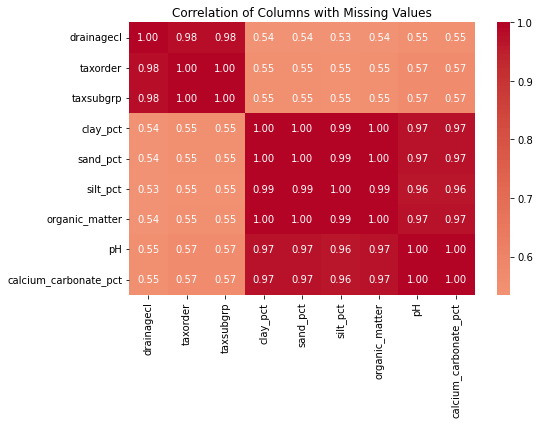

In [14]:
# Correlation heatmap of numeric variables
fig, ax = plt.subplots(figsize=(8, 6))

corr_matrix = missing_corr

sns.heatmap(corr_matrix,
            annot=True,
            fmt='.2f',
            cmap='coolwarm',
            center=0,
            ax=ax)

ax.set_title('Correlation of Columns with Missing Values')
plt.tight_layout()
plt.show()

In [15]:
# Missing rows drill-down:
nan_df = df[df.isna().any(axis=1)]
print("What are the component names for rows with missing taxonomy data?\n")
print(df[df[['taxsubgrp','taxorder']].isna().any(axis=1)]['compname'].value_counts(),"\n")

numeric_cols = ['clay_pct','sand_pct','silt_pct','organic_matter','pH','calcium_carbonate_pct']
print("What numeric columns have values when taxonomy is missing?\n")
print(df[df[['taxsubgrp','taxorder']].isna().any(axis=1)][numeric_cols].notna().sum(),"\n")

print("What are the component names for rows with missing numeric data?\n")
print(df[df[numeric_cols].isna().any(axis=1)]['compname'].value_counts(), "\n")

print("What taxonomy and horizon name values appear when numeric data is missing?\n")
print(df[df[numeric_cols].isna().any(axis=1)].groupby('compname')[['taxorder', 'drainagecl','hzname']].value_counts())


What are the component names for rows with missing taxonomy data?

Urban land      20
Rock outcrop     4
Name: compname, dtype: int64 

What numeric columns have values when taxonomy is missing?

clay_pct                 0
sand_pct                 0
silt_pct                 0
organic_matter           0
pH                       0
calcium_carbonate_pct    0
dtype: int64 

What are the component names for rows with missing numeric data?

Urban land       20
Eckrant           6
Austin            6
Whitewright       4
Brackett          4
Rock outcrop      4
Denton            3
Eddy              3
Speck             3
Purves            3
Pedernales        2
Georgetown        2
Fairlie           2
Crawford          2
Castephen         2
San Saba          2
Alluvial land     1
Real              1
Name: compname, dtype: int64 

What taxonomy and horizon name values appear when numeric data is missing?

compname       taxorder     drainagecl               hzname
Alluvial land  Entisols     Well d

In [16]:
# ── Investigating Non-Standard Horizon Designations ──
# Some hzname values in the dataset use sequential numbering (H1, H2, H3, H4)
# rather than standard SSM designations (A, Bt, Cr, R, etc.).
# Investigate whether these represent real soil horizons or data entry artifacts
# by checking which soil series use them and whether their depths are consistent.

df[df['hzname'].isin(['H1', 'H2', 'H3', 'H4'])].groupby(
    ['compname', 'hzname'])[['depth_top_cm', 'depth_bot_cm']].agg(
        ['min', 'max', 'nunique'])

depth_top_cm              depth_bot_cm             
                              min  max nunique          min  max nunique
compname      hzname                                                    
Alluvial land H1                0    0       1          122  122       1
Altoga        H1                0    0       1           13   15       2
              H2               13   15       2           61   61       1
              H3               61   61       1          152  152       1
Austin        H1                0    0       1           23   38       3
...                           ...  ...     ...          ...  ...     ...
Whitewright   H3               36   41       2          122  122       1
Yahola        H1                0    0       1           36   38       2
              H2               36   38       2          102  102       1
              H3              102  102       1          142  142       1
              H4              142  142       1          183  183       1

[68 rows x 6 columns]

#### General Observations
* Taxonomic order and subgroup, when missing, are always missing together, and
almost always with missing drainage class.  
* Of the 24 rows where taxonomy is missing, the component is primarily urban land, with some rock outcrop.  According to the SSM, urban land is characterized as "mostly covered by streets, parking lots, buildings, and other structures of urban areas" and rock outcrop is exposed bedrock.  In both cases, it makes sense that there is no soil to measure.

##### Missing Numeric Measurements
The 69-70 rows with missing numeric measurements (clay %, sand %, silt %, organic matter, pH, and calcium carbonate) fall into three distinct groups:
* **Group 1** — Non-soil components: Urban land and Rock outcrop, which were already identified in the taxonomy cluster. These are missing all measurements because there is no soil to measure.
* **Group 2** — Bedrock horizons (R, 2R): These are layers of hard, unweatherable rock at the bottom of otherwise valid soil profiles. Properties like clay percentage and pH cannot be measured on solid rock, so missing values here are expected and appropriate.
* **Group 3** — Paralithic horizons (Cr): Similar to bedrock, but the rock is partially weathered and soft enough for roots to penetrate. Still not measurable for standard soil properties.
* **Group 4** — Non-standard H-labeled horizons (H1, H2, H3): Some horizons in legitimate soil series (Austin, Castephen, Eddy, Whitewright, Alluvial land) use sequential numbering rather than standard SSM horizon designations. Unlike A, Bt, Cr, and similar labels, H1-H4 are not defined in any NRCS reference document. A subset of these rows have no numeric data populated.


#### Treatment Plan

Rows with missing numeric measurements fall into identifiable categories, each with a clear reason for removal:

1. **Remove non-soil components** — rows where the component is Urban land
   or Rock outcrop. These have no soil to measure.

2. **Remove bedrock and paralithic horizons** — rows where hzname is R, 2R,
   or Cr. These layers are physically unmeasurable.

3. **Remove H-labeled horizons with no numeric data** — rows where hzname is
   H1, H2, H3, or H4 and all numeric measurement columns are null. H-labeled
   rows with valid measurements are retained.

4. **Verify** no remaining missing values in the five model columns: clay %,
   silt %, organic matter, calcium carbonate %, and pH.

Taxonomic columns (taxorder, taxsubgrp, drainagecl) may still have missing
values after cleaning. This is acceptable — they are only needed for post-clustering validation, not for modeling.

#### Missing Data Treatment

In [17]:
# ── Missing Data Treatment ──

# Step 1: Remove non-soil components
non_soil = ['Urban land', 'Rock outcrop']
df_clean = df[~df['compname'].isin(non_soil)].copy()
print(f"After removing non-soil components: {len(df_clean)} rows")

# Step 2: Remove bedrock and paralithic horizons
bedrock = ['R', '2R', 'Cr']
df_clean = df_clean[~df_clean['hzname'].isin(bedrock)].copy()
print(f"After removing bedrock and paralithic horizons: {len(df_clean)} rows")

# Step 3: Remove H-labeled horizons with no numeric data
numeric_cols = ['clay_pct', 'sand_pct', 'silt_pct', 'organic_matter', 'pH', 'calcium_carbonate_pct']
h_labels = ['H1', 'H2', 'H3', 'H4']
h_no_data = df_clean['hzname'].isin(h_labels) & df_clean[numeric_cols].isnull().all(axis=1)
df_clean = df_clean[~h_no_data].copy()
print(f"After removing empty H-labeled horizons: {len(df_clean)} rows")

# Step 4: Verify no remaining missing values in model columns
print(f"\nRemaining missing values in model columns:")
print(df_clean[numeric_cols].isnull().sum())
print(f"\nFinal dataset: {len(df_clean)} rows, {df_clean.shape[1]} columns")

After removing non-soil components: 360 rows
After removing bedrock and paralithic horizons: 327 rows
After removing empty H-labeled horizons: 315 rows

Remaining missing values in model columns:
clay_pct                 0
sand_pct                 0
silt_pct                 1
organic_matter           0
pH                       0
calcium_carbonate_pct    0
dtype: int64

Final dataset: 315 rows, 16 columns


One row still has missing data -- for silt_pct.  

In [18]:
df_clean[df_clean['silt_pct'].isnull()]

,muname,mukey,compname,comppct_r,drainagecl,taxorder,taxsubgrp,depth_top_cm,depth_bot_cm,hzname,clay_pct,sand_pct,silt_pct,organic_matter,pH,calcium_carbonate_pct
256,"Mixed alluvial land, 0 to 1 percent slopes, fr...",393225,Alluvial land,100,Well drained,Entisols,Typic Ustifluvents,0,122,H1,5.0,90.0,NaN,1.05,8.2,65.0


Since sand %, clay %, and silt % must sum to 100 by definition,
the missing silt value can be calculated directly: 100 - 90.0 - 5.0 = 5.0.

In [19]:
# Derive silt_pct:
df_clean.loc[df_clean['silt_pct'].isnull(), 'silt_pct'] = 100 - df_clean['clay_pct'] - df_clean['sand_pct']
# Confirm no missing data remaining:
print(f"\nRemaining missing values in model columns:")
print(df_clean[numeric_cols].isnull().sum())
print(f"\nFinal dataset: {len(df_clean)} rows, {df_clean.shape[1]} columns")


Remaining missing values in model columns:
clay_pct                 0
sand_pct                 0
silt_pct                 0
organic_matter           0
pH                       0
calcium_carbonate_pct    0
dtype: int64

Final dataset: 315 rows, 16 columns


#### Validating the Cleaning Decision

We compare summary statistics before and after cleaning to confirm that removing 69 rows did not distort the dataset. If the min, max, and mean values are similar before and after, it indicates the removed rows were not concentrated at any particular value range, supporting our decision to drop rather than impute.

In [20]:
# ── Validating the Cleaning Decision ──────────────────────────────────

measurement_cols = ['pH', 'clay_pct', 'sand_pct', 'silt_pct',
                    'organic_matter', 'calcium_carbonate_pct',
                    'depth_top_cm', 'depth_bot_cm']

print("=== BEFORE CLEANING ===")
print(df[measurement_cols].describe().round(2))

print("\n=== AFTER CLEANING ===")
print(df_clean[measurement_cols].describe().round(2))

print("\n=== ROW COUNTS ===")
print(f"Original:  {len(df)} rows")
print(f"Cleaned:   {len(df_clean)} rows")
print(f"Removed:   {len(df) - len(df_clean)} rows ({((len(df) - len(df_clean)) / len(df) * 100):.1f}%)")

print("\n=== TOP 10 COMPONENTS BEFORE CLEANING ===")
print(df['compname'].value_counts().head(10))

print("\n=== TOP 10 COMPONENTS AFTER CLEANING ===")
print(df_clean['compname'].value_counts().head(10))

=== BEFORE CLEANING ===
           pH  clay_pct  sand_pct  silt_pct  organic_matter  \
count  318.00    315.00    315.00    314.00          315.00   
mean     7.79     38.13     27.67     34.30            1.36   
std      0.59     13.73     21.00     14.39            1.10   
min      5.60      5.00      1.00      0.00            0.20   
25%      7.60     30.00     13.50     27.90            0.50   
50%      8.00     42.50     22.00     29.50            0.80   
75%      8.20     50.00     32.00     47.00            2.00   
max      8.20     70.00     91.70     68.90            6.00   

       calcium_carbonate_pct  depth_top_cm  depth_bot_cm  
count                 318.00         384.0        384.00  
mean                   21.04          41.9         92.49  
std                    22.59          47.9         62.28  
min                     0.00           0.0          8.00  
25%                     3.00           0.0         36.00  
50%                    10.00          20.0         86.

#### Observations on Data After Cleaning

The before and after statistics are remarkably stable, supporting the
decision to drop rather than impute:

- **pH, clay, sand, silt, and organic matter** — means, standard
  deviations, and ranges are virtually identical before and after cleaning.
  The removed rows were not concentrated at any particular value range.

- **Calcium carbonate** — the maximum dropped from 80% to 70%, and the
  mean dropped slightly from 21.04 to 20.48. One of the highest recorded
  values was in a removed row, but the overall distribution is preserved.

- **Depth** — the median bottom depth shifted from 86.5 to 68.0 cm,
  reflecting the removal of deep bedrock and paralithic horizons which
  tended to occur at greater depths. This is expected and appropriate.

**Component list shift**: Urban land was the second most common component
in the original data with 20 rows and its removal is significant. Austin
dropped from 21 to 15 rows, and Brackett disappeared from the top 10
entirely. Three new components appeared — Volente, Oakalla, and Wilson —
which were previously obscured by the non-soil rows.

### Macrostrat Missing Data

In [21]:
# Check for missing values in key Macrostrat columns
key_cols = ['unit_name', 't_age', 'b_age', 'primary_lith', 'rock_class']

print("=== Missing values in key columns ===")
print("\nSan Marcos Arch:")
print(df_sma[key_cols].isnull().sum())

print("\nLlano Uplift:")
print(df_llano[key_cols].isnull().sum())

=== Missing values in key columns ===

San Marcos Arch:
unit_name       0
t_age           0
b_age           0
primary_lith    0
rock_class      0
dtype: int64

Llano Uplift:
unit_name       0
t_age           0
b_age           0
primary_lith    0
rock_class      0
dtype: int64


## EDA
Before modeling, we examine the distributions and relationships in the cleaned dataset. The goal is to understand what the data looks like, identify patterns that might inform feature selection, and surface any
surprises that could affect how we interpret the model results.

### SSURGO Soil Properties

#### Soil Properties

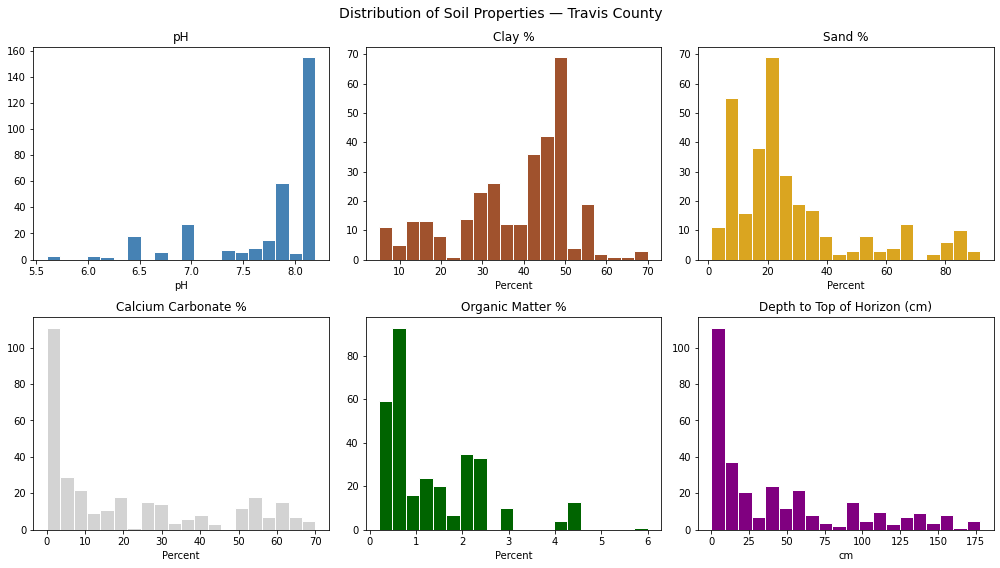

In [22]:
# Soil Property Histograms
%matplotlib inline

fig, axes = plt.subplots(2, 3, figsize=(14, 8))
fig.suptitle('Distribution of Soil Properties — Travis County', fontsize=14)

axes[0,0].hist(df_clean['pH'], bins=20, color='steelblue', edgecolor='white')
axes[0,0].set_title('pH')
axes[0,0].set_xlabel('pH')

axes[0,1].hist(df_clean['clay_pct'], bins=20, color='sienna', edgecolor='white')
axes[0,1].set_title('Clay %')
axes[0,1].set_xlabel('Percent')

axes[0,2].hist(df_clean['sand_pct'], bins=20, color='goldenrod', edgecolor='white')
axes[0,2].set_title('Sand %')
axes[0,2].set_xlabel('Percent')

axes[1,0].hist(df_clean['calcium_carbonate_pct'], bins=20, color='lightgray', edgecolor='white')
axes[1,0].set_title('Calcium Carbonate %')
axes[1,0].set_xlabel('Percent')

axes[1,1].hist(df_clean['organic_matter'], bins=20, color='darkgreen', edgecolor='white')
axes[1,1].set_title('Organic Matter %')
axes[1,1].set_xlabel('Percent')

axes[1,2].hist(df_clean['depth_top_cm'], bins=20, color='purple', edgecolor='white')
axes[1,2].set_title('Depth to Top of Horizon (cm)')
axes[1,2].set_xlabel('cm')

plt.tight_layout()
plt.show()

##### Observations

**pH** — The distribution is strongly skewed toward high alkalinity. The overwhelming majority of horizons have pH at or above 8.0, with a large spike at 8.2. There is a small but distinct cluster of more acidic soils between 5.5 and 7.0 that stands out against the otherwise uniform alkalinity.

**Clay %** — The most common clay content is around 40-50%, but the range is wide, from 5% all the way to 70%. This tells us the dataset captures some genuinely different soil types, not just one uniform clay.

**Sand %** — Most soils have relatively low sand content, below 30%. This is not a particularly sandy part of Texas.

**Calcium Carbonate %** — Most samples have very little calcium carbonate, with the distribution heavily concentrated near 0%. However, the data has a long tail stretching out to 70%, with small numbers of horizons showing very high values throughout that range. Those high values likely represent the caliche layers and limestone fragments that anyone digging in this area will recognize immediately.

**Organic Matter %** — Values are concentrated below 2%, but the distribution has a notable tail extending to around 4-4.5%. This is typical when looking across all depth layers. Organic matter is highest near the surface and drops off quickly below it, so the bulk of horizons in the dataset show low values.

**Depth** — Most horizons start near the surface, with a large spike in the 0-25cm range. Counts drop off as depth increases, though there are secondary clusters around 50cm and 125-150cm, reflecting common horizon boundaries across the soil series in Travis County.

#### Soil Property by Depth

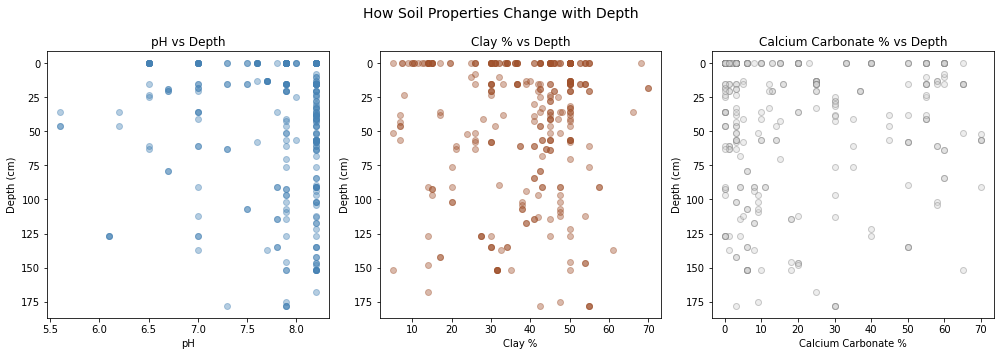

In [23]:
fig, axes = plt.subplots(1, 3, figsize=(14, 5))
fig.suptitle('How Soil Properties Change with Depth', fontsize=14)

axes[0].scatter(df_clean['pH'], df_clean['depth_top_cm'],
                alpha=0.4, color='steelblue')
axes[0].set_xlabel('pH')
axes[0].set_ylabel('Depth (cm)')
axes[0].set_title('pH vs Depth')
axes[0].invert_yaxis()

axes[1].scatter(df_clean['clay_pct'], df_clean['depth_top_cm'],
                alpha=0.4, color='sienna')
axes[1].set_xlabel('Clay %')
axes[1].set_ylabel('Depth (cm)')
axes[1].set_title('Clay % vs Depth')
axes[1].invert_yaxis()

axes[2].scatter(df_clean['calcium_carbonate_pct'], df_clean['depth_top_cm'],
                alpha=0.4, color='lightgray', edgecolors='gray')
axes[2].set_xlabel('Calcium Carbonate %')
axes[2].set_ylabel('Depth (cm)')
axes[2].set_title('Calcium Carbonate % vs Depth')
axes[2].invert_yaxis()

plt.tight_layout()
plt.show()

##### Observations

These three plots show depth increasing downward. Each dot is one soil horizon (a distinct layer) from somewhere in Travis County.

**pH vs Depth** — Near the surface, pH varies considerably, including the acidic cluster visible between 5.5 and 7.0, which appears at multiple depths rather than being concentrated near the surface. Deeper down, the values converge strongly toward 8.0-8.2. The deeper you go, the more the limestone dominates and the less variation there is.

**Clay % vs Depth** — Clay content is all over the map at every depth. There is no clear pattern of clay increasing or decreasing as you dig deeper. This suggests that how much clay a soil has depends more on which type of soil you are in than how deep you are within it.

**Calcium Carbonate % vs Depth** — High calcium carbonate values appear at all depths, but the spread is widest near the surface — ranging from near 0% all the way to 65%+ in the top 25cm. At greater depths, high values persist but the range narrows somewhat. This is consistent with caliche and limestone occurring at different depths across different locations in Travis County rather than at one predictable layer.

It is worth noting that these plots mix together many different locations across the county. A single hole dug in one backyard would likely show much cleaner patterns, which is part of what makes the actual experience of digging in my backyard so interesting compared to what the county-wide data can show.

#### Soil by Drainage Class

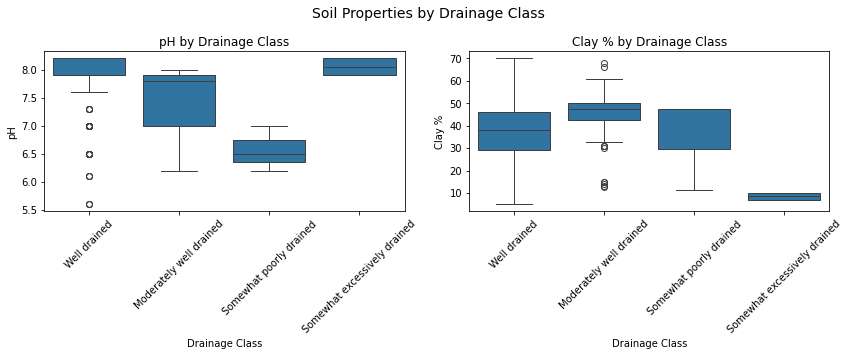


Drainage class counts:
Well drained                    223
Moderately well drained          85
Somewhat excessively drained      4
Somewhat poorly drained           3
Name: drainagecl, dtype: int64


In [24]:
# Boxplots for soil properties by drainage class
fig, axes = plt.subplots(1, 2, figsize=(12, 5))
fig.suptitle('Soil Properties by Drainage Class', fontsize=14)

df_drain = df_clean.dropna(subset=['drainagecl'])

sns.boxplot(data=df_drain, x='drainagecl', y='pH', ax=axes[0])
axes[0].set_title('pH by Drainage Class')
axes[0].set_xlabel('Drainage Class')
axes[0].set_ylabel('pH')
axes[0].tick_params(axis='x', rotation=45)

sns.boxplot(data=df_drain, x='drainagecl', y='clay_pct', ax=axes[1])
axes[1].set_title('Clay % by Drainage Class')
axes[1].set_xlabel('Drainage Class')
axes[1].set_ylabel('Clay %')
axes[1].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()

print("\nDrainage class counts:")
print(df_drain['drainagecl'].value_counts())

##### Observations

Drainage class describes how quickly water moves through a soil from "well drained" (water moves through freely) to "somewhat poorly drained" (water tends to sit).

**pH by Drainage Class** — The pattern here is striking. Well drained and somewhat excessively drained soils cluster tightly around 8.0-8.2, consistent with limestone-dominated soils. Somewhat poorly drained soils are clearly more acidic, clustering around 6.5. Moderately well drained soils show the most variation of any class; the box spans nearly the full pH range in the dataset. Well drained soils also show several outliers pulling down toward 5.5, which are likely the same acidic cluster visible in the earlier plots.

**Clay % by Drainage Class** — Somewhat excessively drained soils have very low clay content at around 9% with almost no variation, which explains why they drain so freely. The other three classes all show high clay content in the 30-50% range,
but with notable differences in spread. Moderately well drained soils have two high outliers around 65-68%. Somewhat poorly drained soils show a wide range with some outliers pulling down toward 13%. The fact that three drainage classes share
similarly high clay content but drain differently suggests clay content alone does not determine drainage behavior.

**A note on sample sizes** — The drainage class counts are highly uneven. Well drained dominates with 223 rows, moderately well drained has 85, but somewhat excessively drained has only 4 rows and somewhat poorly drained only 3. The box plots for those two smaller classes are based on very little data and should be interpreted with caution.

One interesting takeaway: Clay content alone does not fully explain drainage behavior in this dataset. Three of the four drainage classes share similarly high clay content despite draining differently. pH tracks drainage class more cleanly than clay does, suggesting that what formation a soil came from matters more than how much clay it contains. That is not what one might intuitively expect, and it is worth keeping in mind when we build the regression model.

#### Correlation Heatmap

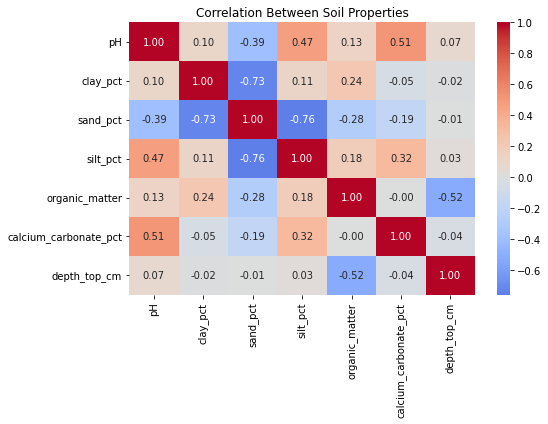

In [25]:
# Correlation heatmap of numeric variables
fig, ax = plt.subplots(figsize=(8, 6))

numeric_cols = ['pH', 'clay_pct', 'sand_pct', 'silt_pct',
                'organic_matter', 'calcium_carbonate_pct',
                'depth_top_cm']

corr_matrix = df_clean[numeric_cols].corr()

sns.heatmap(corr_matrix,
            annot=True,
            fmt='.2f',
            cmap='coolwarm',
            center=0,
            ax=ax)

ax.set_title('Correlation Between Soil Properties')
plt.tight_layout()
plt.show()

##### How the Soil Properties Relate to Each Other

This heatmap shows how strongly each pair of variables is correlated.
Values close to 1.0 (dark red) mean the two variables tend to increase
together. Values close to -1.0 (dark blue) mean when one goes up the
other tends to go down. Values near 0 mean little relationship.

**What predicts pH?**
- **Calcium carbonate (0.51)** — the strongest predictor of pH in this dataset. More limestone and caliche means higher pH, which is exactly what you'd expect in an area underlain by limestone.
- **Silt % (0.47)** — moderately correlated with pH. Silty soils in Travis County tend to be more alkaline.
- **Sand % (-0.39)** — sandier soils tend to have lower pH.
- **Clay % (0.10)** — essentially no relationship with pH. Despite clay being the dominant texture in Travis County soils, it does not appear to drive acidity or alkalinity.
- **Depth (0.07)** — essentially no relationship between depth and pH across the whole county dataset. pH is driven more by soil type than by depth alone.

**Other interesting relationships:**
- **Sand and clay (-0.73)** — strongly negative, which makes perfect sense. A soil can't be both sandy and clayey at the same time.
- **Sand and silt (-0.76)** — same logic. Sand, silt, and clay always add up to 100%, so they are inherently linked.
- **Organic matter and depth (-0.52)** — organic matter drops off significantly as you go deeper, which matches the earlier histogram. Living things and decomposing material concentrate near the surface.

**What this means for modeling:**
Calcium carbonate and silt % are the strongest predictors of pH going into the regression. Clay % and depth show almost no correlation with pH individually, but may still contribute when combined with other variables in a multiple regression. Sand % is negatively correlated with pH but also strongly correlated with clay and silt, which means including all three texture variables in the same model risks multicollinearity.

### Macrostrat Geological Formations

In [26]:
# ── Macrostrat Geological Timeline ────────────────────────────────────
# Select the key formations relevant to the rocks found in the area
# and combine into a single dataframe for visualization.

# Local Cretaceous formations from San Marcos Arch
key_formations_sma = df_sma[df_sma['unit_name'].isin([
    'Austin Chalk', 'Taylor Fm', 'Eagle Ford Fm'
])].copy()
key_formations_sma['source'] = 'San Marcos Arch (local)'

# Ancient Precambrian formations from Llano Uplift
key_formations_llano = df_llano[df_llano['unit_name'].isin([
    'Town Mountain Granite', 'Red Mountain Gneiss',
    'Packsaddle Schist', 'Valley Springs Gneiss'
])].copy()
key_formations_llano['source'] = 'Llano Uplift (regional)'

# Combine into single timeline dataframe
df_timeline = pd.concat([key_formations_sma, key_formations_llano],
                         ignore_index=True)

# Map rock class to color for visualization
color_map = {
    'sedimentary': 'steelblue',
    'igneous':     'sienna',
    'metamorphic': 'darkgreen'
}
df_timeline['color'] = df_timeline['rock_class'].map(color_map)

print(f"Timeline dataset: {len(df_timeline)} formations")
print(df_timeline[['unit_name', 'source', 'primary_lith',
                    'rock_class', 't_age', 'b_age']].to_string())

Timeline dataset: 8 formations
               unit_name                   source primary_lith   rock_class      t_age      b_age
0              Taylor Fm  San Marcos Arch (local)        shale  sedimentary    70.6500    80.7500
1           Austin Chalk  San Marcos Arch (local)        chalk  sedimentary    80.7500    90.7225
2          Eagle Ford Fm  San Marcos Arch (local)        shale  sedimentary    90.9275    92.8750
3          Eagle Ford Fm  San Marcos Arch (local)        shale  sedimentary    93.9000    95.0000
4  Town Mountain Granite  Llano Uplift (regional)      granite      igneous  1063.0000  1093.3340
5    Red Mountain Gneiss  Llano Uplift (regional)      granite      igneous  1093.3340  1105.0000
6      Packsaddle Schist  Llano Uplift (regional)       schist  metamorphic  1141.0000  1160.0000
7  Valley Springs Gneiss  Llano Uplift (regional)       gneiss  metamorphic  1160.0000  1220.0000


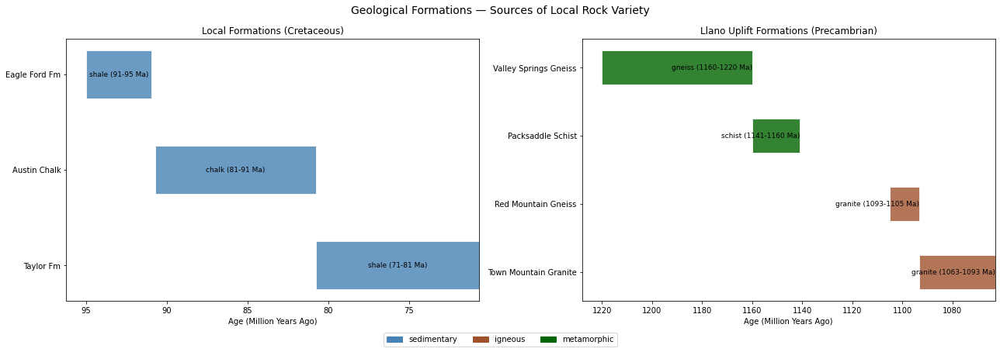

In [27]:
# ── Geological Timeline Visualization ──

# Two side-by-side horizontal bar charts showing the age ranges of key
# geological formations relevant to the rocks found in the area.

# Left plot: Local Cretaceous formations (Austin Chalk, Taylor Marl, Eagle Ford)
# Right plot: Ancient Precambrian formations from the Llano Uplift

# Bar width represents the duration of the formation (b_age - t_age)
# Color indicates rock class: sedimentary (blue), igneous (brown), metamorphic (green)
# X-axis is inverted so older rocks appear further right, matching geological convention
# The two Eagle Ford entries are merged into one bar for clarity


import matplotlib.patches as mpatches

# Merge the two Eagle Ford entries into one bar for clarity
df_timeline_plot = df_timeline.copy()
eagle_ford_mask = df_timeline_plot['unit_name'] == 'Eagle Ford Fm'
if eagle_ford_mask.sum() > 1:
    ef_min = df_timeline_plot[eagle_ford_mask]['t_age'].min()
    ef_max = df_timeline_plot[eagle_ford_mask]['b_age'].max()
    df_timeline_plot = df_timeline_plot[~eagle_ford_mask]
    df_timeline_plot = pd.concat([df_timeline_plot, pd.DataFrame([{
        'unit_name': 'Eagle Ford Fm',
        'source': 'San Marcos Arch (local)',
        'primary_lith': 'shale',
        'rock_class': 'sedimentary',
        'color': 'steelblue',
        't_age': ef_min,
        'b_age': ef_max
    }])], ignore_index=True)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 6))
fig.suptitle('Geological Formations — Sources of Local Rock Variety', fontsize=14)

# ── Left plot: Local formations (Cretaceous, 70-95 million years ago) ──
local = df_timeline_plot[df_timeline_plot['source'] == 'San Marcos Arch (local)']
for i, row in local.iterrows():
    ax1.barh(y=row['unit_name'],
             left=row['t_age'],
             width=row['b_age'] - row['t_age'],
             color=row['color'], alpha=0.8, edgecolor='white', height=0.5)
    mid = (row['t_age'] + row['b_age']) / 2
    ax1.text(mid, row['unit_name'],
             f"{row['primary_lith']} ({row['t_age']:.0f}-{row['b_age']:.0f} Ma)",
             #ha='center', va='center', fontsize=9, color='black', fontweight='bold')
             ha='center', va='center', fontsize=9, color='black')
ax1.set_xlabel('Age (Million Years Ago)')
ax1.set_title('Local Formations (Cretaceous)')
ax1.invert_xaxis()

# ── Right plot: Llano Uplift formations (Precambrian, 1063-1220 million years ago) ──
# These ancient igneous and metamorphic rocks are the likely source of
# the pink granite and dark crystalline rocks found in the area.
# Labels placed to the left of each bar to avoid truncation on narrow bars.
regional = df_timeline_plot[df_timeline_plot['source'] == 'Llano Uplift (regional)']
# for i, row in regional.iterrows():
#     ax2.barh(y=row['unit_name'],
#              left=row['t_age'],
#              width=row['b_age'] - row['t_age'],
#              color=row['color'], alpha=0.8, edgecolor='white', height=0.5)
#     ax2.text(row['t_age'] - 2, row['unit_name'],
#              f"{row['primary_lith']} ({row['t_age']:.0f}-{row['b_age']:.0f} Ma)",
#              ha='right', va='center', fontsize=8, color='black')
for i, row in regional.iterrows():
    ax2.barh(y=row['unit_name'],
             left=row['t_age'],
             width=row['b_age'] - row['t_age'],
             color=row['color'], alpha=0.8, edgecolor='white', height=0.5)
    # All labels placed to the left of the bar for consistency
    ax2.text(row['t_age'], row['unit_name'],
         f"{row['primary_lith']} ({row['t_age']:.0f}-{row['b_age']:.0f} Ma)",
         ha='right', va='center', fontsize=9, color='black')
ax2.set_xlabel('Age (Million Years Ago)')
ax2.set_title('Llano Uplift Formations (Precambrian)')
ax2.invert_xaxis()

# Shared legend at the bottom identifying rock classes by color
patches = [mpatches.Patch(color=v, label=k) for k, v in color_map.items()]
fig.legend(handles=patches, loc='lower center', ncol=3, bbox_to_anchor=(0.5, -0.05))

plt.tight_layout()
plt.show()

##### Observations

The timeline reveals something striking — rocks from a Central Austin backyard can span nearly a billion years of geological time.

The local Cretaceous formations (Austin Chalk, Taylor Marl, Eagle Ford) were deposited in the same ancient shallow sea 70-95 million years ago, stacked on top of each other as conditions changed. These are the source of the chalky white fragments, caliche nodules, chert, and dark clay that anyone digging here will encounter.

The Llano Uplift formations tell a completely different story with granite, gneiss, and schist formed deep underground over a billion years ago, now exposed at the surface in the Texas Hill Country. Among the rocks found when digging in this area are smooth pink and red crystalline pieces that resemble granite or related igneous material. Whether they connect to the Llano Uplift or arrived some other way is an open question.

**Note:** The San Marcos Arch column is the nearest available stratigraphic reference in Macrostrat (approximately 30 miles south of the study area) and is used here as a reasonable proxy for local geology.

## Modeling

The EDA above confirms that calcium carbonate and silt % are the strongest numeric predictors of pH, while clay % and depth show weak individual correlations. Sand % is negatively correlated with pH but also strongly tied to the other texture variables. With these relationships in mind, we now build the four models outlined in the modeling plan.

### Model 1: Depth as a predictor of pH and calcium carbonate
A simple linear regression using depth as the sole predictor, one model for pH and one for calcium carbonate content.

In [28]:
# ── Model 1: Does Depth Predict pH and Calcium Carbonate? ─────────────
# Simple linear regression using depth as the sole predictor.
# We run this twice — once for pH and once for calcium carbonate —
# to test whether either variable changes consistently with depth.

depth = df_clean['depth_top_cm'].values.reshape(-1, 1)

for target_name in ['pH', 'calcium_carbonate_pct']:
    y = df_clean[target_name].values

    # Add bias column
    m = depth.shape[0]
    X_b = np.hstack([np.ones((m, 1)), depth])

    # Solve normal equations
    w = np.linalg.inv(X_b.T @ X_b) @ X_b.T @ y

    # Predictions and residuals
    y_pred = X_b @ w
    residuals = y - y_pred

    # R-squared
    ss_res = (residuals**2).sum()
    ss_tot = ((y - y.mean())**2).sum()
    r2 = 1 - ss_res/ss_tot

    print(f"Target: {target_name}")
    print(f"  Intercept:  {w[0]:.4f}")
    print(f"  Depth slope: {w[1]:.4f}")
    print(f"  R-squared:   {r2:.4f}")
    print(f"  MAE:         {np.abs(residuals).mean():.4f}")
    print()

Target: pH
  Intercept:  7.7446
  Depth slope: 0.0009
  R-squared:   0.0055
  MAE:         0.4590

Target: calcium_carbonate_pct
  Intercept:  21.2515
  Depth slope: -0.0182
  R-squared:   0.0017
  MAE:         18.8114



#### Model 1 Observations

Depth alone is a very poor predictor of both pH and calcium carbonate. The R-squared values of 0.006 and 0.002 respectively indicate that depth explains less than 1% of the variation in either variable across Travis County.

This is consistent with what the scatter plots showed in the EDA. Neither pH nor calcium carbonate changes in a consistent, predictable way as depth increases when looking across the county as a whole. The geology varies too much by location for depth alone to be a reliable signal.

#### Model 1: Cross-Validation

Cross-validation was not performed for Model 1. With an R-squared of 0.006 for pH and 0.002 for calcium carbonate on the full dataset, depth alone explains essentially none of the variation in either variable. Cross-validation would only confirm that this is not a useful predictive model.

This sets up an important question for Model 2: if depth alone can't predict pH, can a combination of soil properties do better?

### Model 2: Predicting pH from soil properties
A multiple linear regression using calcium carbonate %, silt %, clay %, organic matter %, and depth as features to predict pH. Sand % is excluded due to multicollinearity given that clay, silt, and sand always sum to 100%, making sand redundant given the other two.

In [29]:
# ── Model 2: Can we predict pH from soil properties? ──────────────────
# Multiple linear regression using soil properties as predictors.
# Sand % is excluded due to multicollinearity — clay, silt, and sand always
# sum to 100%, so sand is redundant given the other two.

# Step 1: Select features and target
features = ['calcium_carbonate_pct', 'silt_pct', 'clay_pct',
            'organic_matter', 'depth_top_cm']
target = 'pH'

X = df_clean[features].values
y = df_clean[target].values

# Step 2: Normalize features (z-score standardization)
X_mean = X.mean(axis=0)
X_std  = X.std(axis=0)
X_norm = (X - X_mean) / X_std

# Step 3: Add bias column (column of 1s)
m = X_norm.shape[0]
X_b = np.hstack([np.ones((m, 1)), X_norm])

# Step 4: Solve normal equations: w = (X^T X)^{-1} X^T y
w = np.linalg.inv(X_b.T @ X_b) @ X_b.T @ y

print("Learned weights:")
print(f"  Intercept:              {w[0]:.4f}")
for i, feat in enumerate(features):
    print(f"  {feat:30s}: {w[i+1]:.4f}")

# Step 5: Predictions and residuals
y_pred = X_b @ w
residuals = y - y_pred

# Step 6: R-squared
ss_res = (residuals**2).sum()
ss_tot = ((y - y.mean())**2).sum()
r2 = 1 - ss_res/ss_tot

print(f"\nR-squared: {r2:.4f}")
print(f"Mean absolute error: {np.abs(residuals).mean():.4f}")

Learned weights:
  Intercept:              7.7829
  calcium_carbonate_pct         : 0.2539
  silt_pct                      : 0.1794
  clay_pct                      : 0.0340
  organic_matter                : 0.0875
  depth_top_cm                  : 0.0960

R-squared: 0.3988
Mean absolute error: 0.3491


#### Model 2 Observations

The model explains 40% of the variation in pH across Travis County, with a mean absolute error of 0.35 pH units.

**Feature weights** — Because the features were normalized before fitting, the weights are directly comparable to each other. A larger weight means that feature has a stronger influence on the prediction:

- **Calcium carbonate (0.2539)** — the strongest driver of pH, consistent with what the correlation heatmap showed. More limestone and caliche means higher pH.
- **Silt % (0.1794)** — second strongest, also consistent with the EDA.
- **Depth (0.0960)** — modest contribution, stronger here than its individual correlation with pH suggested.
- **Organic matter (0.0875)** — modest contribution, consistent with its weak individual correlation with pH.
- **Clay % (0.0340)** — weakest influence, consistent with the near-zero correlation seen in the EDA.

The model agrees with what the EDA suggested, that calcium carbonate and silt are the dominant drivers of pH in this dataset.

**On the overall fit** — An R-squared of 0.40 leaves a lot of variation unexplained. This is likely because the dataset covers all of Travis County, mixing together many different soil series with different parent materials and histories. Additionally, pH in this dataset clusters so heavily around 8.0-8.2 that there isn't much variation to explain. The model is essentially
trying to predict a variable that barely moves for most of the data. The small acidic cluster around 6.5 is likely driving what little predictive power exists.

Model 3 explores whether the data naturally separates into distinct groups, which may be more revealing than trying to predict a single continuous value across the whole county.

#### Model 2 K-Fold Cross-Validation (k=5)

In [30]:
# ── Cross-Validation: Model 2 ─────────────────────────────────────────
# K-fold cross-validation (k=5) to estimate model performance.
# With only 315 rows, a traditional train/test split would leave too few
# rows in each set for reliable results.

from sklearn.model_selection import KFold, cross_val_score
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline

features = ['calcium_carbonate_pct', 'silt_pct', 'clay_pct',
            'organic_matter', 'depth_top_cm']
target = 'pH'

X = df_clean[features].values
y = df_clean[target].values

# Build pipeline: normalize then fit
pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('model', LinearRegression())
])

kf = KFold(n_splits=5, shuffle=True, random_state=42)

r2_scores = cross_val_score(pipeline, X, y, cv=kf, scoring='r2')
mae_scores = -cross_val_score(pipeline, X, y, cv=kf, scoring='neg_mean_absolute_error')

print("=== Model 2: 5-Fold Cross-Validation ===")
print(f"R-squared per fold: {r2_scores.round(4)}")
print(f"Mean R-squared:     {r2_scores.mean():.4f} (+/- {r2_scores.std():.4f})")
print(f"MAE per fold:       {mae_scores.round(4)}")
print(f"Mean MAE:           {mae_scores.mean():.4f} (+/- {mae_scores.std():.4f})")

=== Model 2: 5-Fold Cross-Validation ===
R-squared per fold: [0.4033 0.352  0.4442 0.0908 0.362 ]
Mean R-squared:     0.3304 (+/- 0.1242)
MAE per fold:       [0.3766 0.3624 0.3567 0.3246 0.374 ]
Mean MAE:           0.3589 (+/- 0.0186)


##### Model 2: Cross-Validation Results

5-fold cross-validation produced a mean R-squared of 0.33, lower than the 0.40 obtained on the full dataset, which is expected. Fitting on the full dataset always looks better than it really is because the model is being tested on data it was trained on. Cross-validation gives a more honest estimate by testing each fold on data the model hasn't seen.

The MAE is relatively consistent across folds (0.32-0.38), suggesting the model's error is stable but not small, with predictions off by about a third of a pH unit on average.

The R-squared scores show considerable variance — one fold scored only 0.09, pulling the mean down considerably. This suggests the model's explanatory power depends heavily on which soil series happen to land in the training versus test set. Overall, the cross-validation confirms that the model is weak. It captures some signal but leaves most of the variation in pH unexplained.

### Model 3: Clustering soil profiles
An unsupervised clustering analysis using the same numeric soil properties. Taxonomic classification (taxorder, taxsubgrp) and drainage class will not be used as inputs. Instead they will be used afterward to interpret whether the clusters correspond to meaningful geological groups.

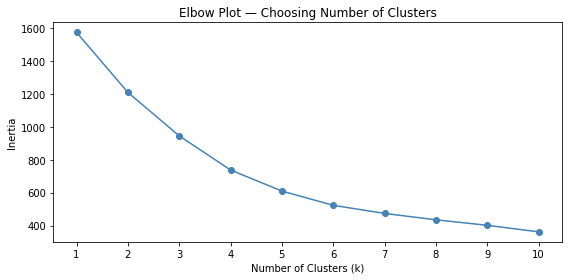

In [31]:
# ── Model 3: K-Means Clustering ───────────────────────────────────────
# Unsupervised clustering using soil properties to find natural groupings.
# Taxonomic classification and drainage class are excluded as inputs —
# they will be used afterward to interpret whether the clusters correspond
# to meaningful geological groups.

from sklearn.cluster import KMeans

# Step 1: Select features and normalize
features = ['calcium_carbonate_pct', 'silt_pct', 'clay_pct',
            'organic_matter', 'depth_top_cm']

X = df_clean[features].values
X_mean = X.mean(axis=0)
X_std  = X.std(axis=0)
X_norm = (X - X_mean) / X_std

# Step 2: Elbow plot to determine optimal number of clusters
inertias = []
k_range = range(1, 11)

for k in k_range:
    km = KMeans(n_clusters=k, random_state=42, n_init=10)
    km.fit(X_norm)
    inertias.append(km.inertia_)

plt.figure(figsize=(8, 4))
plt.plot(k_range, inertias, marker='o', color='steelblue')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Inertia')
plt.title('Elbow Plot — Choosing Number of Clusters')
plt.xticks(k_range)
plt.tight_layout()
plt.show()

The elbow plot shows the largest drops between k=1 and k=3, with a noticeable flattening after k=4. Testing with k=3 and k=4 clusters.

In [32]:
# Step 3: Fit final model with k=4
km4 = KMeans(n_clusters=4, random_state=42, n_init=10)
df_clean['cluster4'] = km4.fit_predict(X_norm)

# Step 4: Cluster summary
print("Cluster sizes:")
print(df_clean['cluster4'].value_counts().sort_index())

print("\nCluster means — original scale:")
print(df_clean.groupby('cluster4')[features + ['pH']].mean().round(2))

Cluster sizes:
0    113
1     41
2     68
3     93
Name: cluster4, dtype: int64

Cluster means — original scale:
          calcium_carbonate_pct  silt_pct  clay_pct  organic_matter  \
cluster4                                                              
0                         13.79     36.69     44.39            2.50   
1                         10.20     14.08     12.88            0.63   
2                         51.88     46.30     35.31            0.99   
3                         10.19     31.21     43.72            0.56   

          depth_top_cm    pH  
cluster4                      
0                 8.50  7.83  
1                34.27  7.40  
2                37.21  8.16  
3                90.42  7.61  


In [33]:
# k=4 taxonomy validation
km4 = KMeans(n_clusters=4, random_state=42, n_init=10)
df_clean['cluster4'] = km4.fit_predict(X_norm)

print("Taxonomy by cluster (k=4):")
print(df_clean.groupby('cluster4')['taxorder'].value_counts())

print("\nDrainage class by cluster (k=4):")
print(df_clean.groupby('cluster4')['drainagecl'].value_counts())

Taxonomy by cluster (k=4):
cluster4  taxorder   
0         Mollisols      65
          Vertisols      41
          Alfisols        4
          Inceptisols     3
1         Alfisols       19
          Entisols       16
          Inceptisols     3
          Mollisols       3
2         Mollisols      33
          Inceptisols    29
          Entisols        6
3         Vertisols      35
          Alfisols       33
          Mollisols      21
          Inceptisols     4
Name: taxorder, dtype: int64

Drainage class by cluster (k=4):
cluster4  drainagecl                  
0         Well drained                    78
          Moderately well drained         35
1         Well drained                    30
          Moderately well drained          6
          Somewhat excessively drained     4
          Somewhat poorly drained          1
2         Well drained                    68
3         Well drained                    47
          Moderately well drained         44
          Somewhat poorl

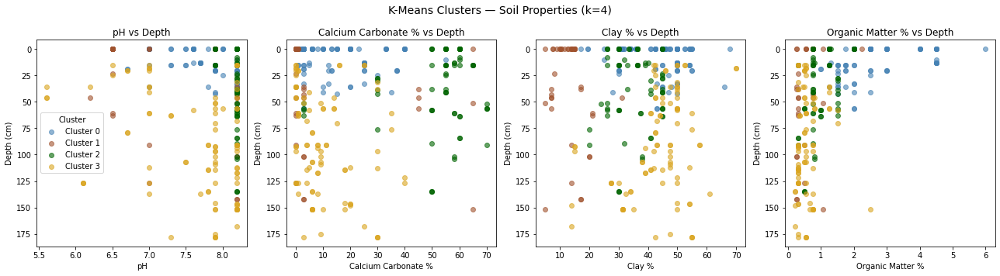

In [34]:
# Step 5: Visualize clusters (k=4)
fig, axes = plt.subplots(1, 4, figsize=(18, 5))
fig.suptitle('K-Means Clusters — Soil Properties (k=4)', fontsize=14)

colors = ['steelblue', 'sienna', 'darkgreen', 'goldenrod']

for cluster in range(4):
    mask = df_clean['cluster4'] == cluster

    axes[0].scatter(df_clean[mask]['pH'],
                    df_clean[mask]['depth_top_cm'],
                    alpha=0.6, color=colors[cluster],
                    label=f'Cluster {cluster}')

    axes[1].scatter(df_clean[mask]['calcium_carbonate_pct'],
                    df_clean[mask]['depth_top_cm'],
                    alpha=0.6, color=colors[cluster])

    axes[2].scatter(df_clean[mask]['clay_pct'],
                    df_clean[mask]['depth_top_cm'],
                    alpha=0.6, color=colors[cluster])

    axes[3].scatter(df_clean[mask]['organic_matter'],
                    df_clean[mask]['depth_top_cm'],
                    alpha=0.6, color=colors[cluster])

for ax in axes:
    ax.invert_yaxis()
    ax.set_ylabel('Depth (cm)')

axes[0].set_xlabel('pH')
axes[0].set_title('pH vs Depth')
axes[1].set_xlabel('Calcium Carbonate %')
axes[1].set_title('Calcium Carbonate % vs Depth')
axes[2].set_xlabel('Clay %')
axes[2].set_title('Clay % vs Depth')
axes[3].set_xlabel('Organic Matter %')
axes[3].set_title('Organic Matter % vs Depth')

axes[0].legend(title='Cluster')
plt.tight_layout()
plt.show()

In [35]:
# Step 3: Fit final model with k=3
km3 = KMeans(n_clusters=3, random_state=42, n_init=10)
df_clean['cluster3'] = km3.fit_predict(X_norm)

print("Cluster sizes:")
print(df_clean['cluster3'].value_counts().sort_index())

print("\nCluster means — original scale:")
print(df_clean.groupby('cluster3')[features + ['pH']].mean().round(2))

Cluster sizes:
0     67
1    128
2    120
Name: cluster3, dtype: int64

Cluster means — original scale:
          calcium_carbonate_pct  silt_pct  clay_pct  organic_matter  \
cluster3                                                              
0                         55.46     43.41     34.60            0.95   
1                         12.97     37.31     44.25            2.36   
2                          8.97     25.75     33.57            0.52   

          depth_top_cm    pH  
cluster3                      
0                37.55  8.16  
1                12.22  7.81  
2                76.88  7.55  


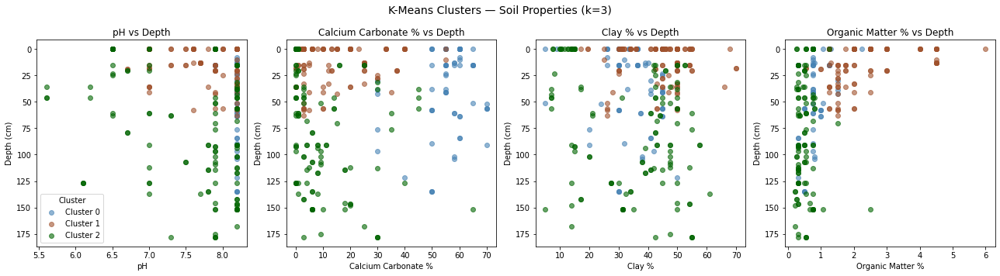

In [36]:
# Visualize clusters (k=3)
fig, axes = plt.subplots(1, 4, figsize=(18, 5))
fig.suptitle('K-Means Clusters — Soil Properties (k=3)', fontsize=14)

colors = ['steelblue', 'sienna', 'darkgreen']

for cluster in range(3):
    mask = df_clean['cluster3'] == cluster

    axes[0].scatter(df_clean[mask]['pH'],
                    df_clean[mask]['depth_top_cm'],
                    alpha=0.6, color=colors[cluster],
                    label=f'Cluster {cluster}')

    axes[1].scatter(df_clean[mask]['calcium_carbonate_pct'],
                    df_clean[mask]['depth_top_cm'],
                    alpha=0.6, color=colors[cluster])

    axes[2].scatter(df_clean[mask]['clay_pct'],
                    df_clean[mask]['depth_top_cm'],
                    alpha=0.6, color=colors[cluster])

    axes[3].scatter(df_clean[mask]['organic_matter'],
                    df_clean[mask]['depth_top_cm'],
                    alpha=0.6, color=colors[cluster])

for ax in axes:
    ax.invert_yaxis()
    ax.set_ylabel('Depth (cm)')

axes[0].set_xlabel('pH')
axes[0].set_title('pH vs Depth')
axes[1].set_xlabel('Calcium Carbonate %')
axes[1].set_title('Calcium Carbonate % vs Depth')
axes[2].set_xlabel('Clay %')
axes[2].set_title('Clay % vs Depth')
axes[3].set_xlabel('Organic Matter %')
axes[3].set_title('Organic Matter % vs Depth')

axes[0].legend(title='Cluster')
plt.tight_layout()
plt.show()

In [37]:
# Step 6: Validate clusters against taxonomy with k=3
print("Taxonomy by cluster:")
print(df_clean.groupby('cluster3')['taxorder'].value_counts())

print("\nDrainage class by cluster:")
print(df_clean.groupby('cluster3')['drainagecl'].value_counts())

Taxonomy by cluster:
cluster3  taxorder   
0         Inceptisols    29
          Mollisols      28
          Entisols        9
          Vertisols       1
1         Mollisols      75
          Vertisols      45
          Alfisols        5
          Inceptisols     3
2         Alfisols       51
          Vertisols      30
          Mollisols      19
          Entisols       13
          Inceptisols     7
Name: taxorder, dtype: int64

Drainage class by cluster:
cluster3  drainagecl                  
0         Well drained                    67
1         Well drained                    88
          Moderately well drained         40
2         Well drained                    68
          Moderately well drained         45
          Somewhat excessively drained     4
          Somewhat poorly drained          3
Name: drainagecl, dtype: int64


#### Model 3 Observations

**Choosing k** — The elbow plot showed the largest drops in inertia between k=1 and k=3, with noticeable flattening after k=4. Both k=3 and k=4 were tested. k=4 split one group into two without adding meaningful visual separation across any of the four variables. k=3 was selected as the more interpretable result.

**Cluster characteristics:**

- **Cluster 0 (128 rows)** — Low calcium carbonate (13%), high clay (44%), highest organic matter (2.36%), shallow average depth (12cm), pH 7.81. These are surface horizons dominated by dark, organic-rich clay, consistent with Taylor Marl surface soils.

- **Cluster 1 (67 rows)** — Very high calcium carbonate (55%), high silt (43%), moderate clay (35%), moderate depth (38cm), highest pH (8.16). These are the limestone-dominated, caliche-rich horizons consistent with Austin Chalk influence.

- **Cluster 2 (120 rows)** — Low calcium carbonate (9%), lower silt (26%), moderate clay (34%), very low organic matter (0.52%), deep average depth (77cm), lowest pH (7.55). These are deeper subsoil horizons, less influenced by surface processes.

**Taxonomy validation** — The clusters do not map cleanly onto soil taxonomic orders. Cluster 0 is dominated by Mollisols and Vertisols, but Cluster 1 — the high calcium carbonate group pulls nearly equally from Inceptisols and Mollisols. Cluster 2 is the most taxonomically diverse, mixing Alfisols, Vertisols, Mollisols, and Entisols. This suggests the physical measurements are grouping soils by their geological character rather than their formal taxonomic classification.

**Drainage class validation** — Cluster 1 is entirely well drained, consistent with limestone-dominated soils that drain freely. Clusters 0 and 2 both contain moderately well drained soils, with Cluster 2 also capturing the somewhat excessively drained and somewhat poorly drained cases, reflecting the greater depth and diversity of that group.

**Overall** — The clustering confirms what the EDA suggested: calcium carbonate content is the strongest dividing line in this dataset, cleanly separating limestone-influenced horizons from clay-dominated ones. Depth and organic matter further distinguish surface from subsoil horizons within the clay-dominated group. However, the clusters do not correspond neatly to the formal soil taxonomy, suggesting that the physical measurements capture geological variation that cuts across taxonomic boundaries.

#### Model 3 K-Fold Cross-Validation (k=5)

In [38]:
# ── Cross-Validation: Model 3 ─────────────────────────────────────────
# K-fold cross-validation for clustering using silhouette score.
# Silhouette score measures how well each point fits its assigned cluster
# versus neighboring clusters. Range: -1 to 1, higher is better.

from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler

features = ['calcium_carbonate_pct', 'silt_pct', 'clay_pct',
            'organic_matter', 'depth_top_cm']

X = df_clean[features].values

kf = KFold(n_splits=5, shuffle=True, random_state=42)
silhouette_scores = []

for fold, (train_idx, test_idx) in enumerate(kf.split(X)):
    X_train = X[train_idx]
    X_test = X[test_idx]

    # Normalize using training fold only
    scaler = StandardScaler()
    X_train_norm = scaler.fit_transform(X_train)
    X_test_norm = scaler.transform(X_test)

    # Fit KMeans on training fold
    km = KMeans(n_clusters=3, random_state=42, n_init=10)
    km.fit(X_train_norm)

    # Predict on test fold and score
    test_labels = km.predict(X_test_norm)
    score = silhouette_score(X_test_norm, test_labels)
    silhouette_scores.append(score)
    print(f"Fold {fold+1}: silhouette score = {score:.4f}")

print(f"\nMean silhouette score: {np.mean(silhouette_scores):.4f} (+/- {np.std(silhouette_scores):.4f})")

Fold 1: silhouette score = 0.3080
Fold 2: silhouette score = 0.2587
Fold 3: silhouette score = 0.2730
Fold 4: silhouette score = 0.2380
Fold 5: silhouette score = 0.2405

Mean silhouette score: 0.2636 (+/- 0.0256)


##### Model 3 Cross-Validation Results

5-fold cross-validation produced a mean silhouette score of 0.27 (+/- 0.02). Silhouette scores range from -1 to 1, where values closer to 1 indicate tight, well-separated clusters and values near 0 indicate overlapping clusters.

A score of 0.27 indicates weak to moderate cluster eparation. The clusters exist but are not tightly defined. This is consistent with what the scatter plots showed: Cluster 1 (high calcium carbonate) separates cleanly, but Clusters 0 and 2 overlap considerably across most variables.

The low variance across folds (+/- 0.02) suggests the clustering is at least stable. The same general structure emerges regardless of which data is held out. However, stability does not imply strength. The overall picture is that the data contains some natural grouping structure, but the clusters are not as distinct as would be needed to make confident geological interpretations.

### Geological Context: What Do the Clusters Actually Represent?

In [39]:
### Geological Context: What Do the Clusters Actually Represent?

# ── Join SSURGO Clusters to Macrostrat Formations ─────────────────────
# Map each SSURGO cluster to its most likely parent geological formation
# based on the dominant soil properties identified in the clustering analysis.
# This linkage is interpretive — soil properties are proxies for geology,
# not a direct measurement of formation membership.

# Create a cluster-to-formation mapping based on cluster characteristics
cluster_formation_map = pd.DataFrame({
    'cluster3': [0, 1, 2],
    'interpreted_formation': ['Taylor Fm', 'Austin Chalk', 'Mixed Subsurface'],
    'formation_age_ma': [75.6, 85.7, None],  # midpoint ages from Macrostrat
    'primary_lith': ['shale', 'chalk', 'mixed'],
    'rock_class': ['sedimentary', 'sedimentary', 'mixed']
})

# Merge cluster summary statistics with formation mapping
cluster_summary = df_clean.groupby('cluster3')[
    ['calcium_carbonate_pct', 'clay_pct', 'organic_matter',
     'depth_top_cm', 'pH']].mean().round(2).reset_index()

cluster_geo = cluster_summary.merge(cluster_formation_map, on='cluster3')

print("SSURGO Clusters linked to Geological Formations:")
print(cluster_geo.to_string())

SSURGO Clusters linked to Geological Formations:
   cluster3  calcium_carbonate_pct  clay_pct  organic_matter  depth_top_cm    pH interpreted_formation  formation_age_ma primary_lith   rock_class
0         0                  55.46     34.60            0.95         37.55  8.16             Taylor Fm              75.6        shale  sedimentary
1         1                  12.97     44.25            2.36         12.22  7.81          Austin Chalk              85.7        chalk  sedimentary
2         2                   8.97     33.57            0.52         76.88  7.55      Mixed Subsurface               NaN        mixed        mixed


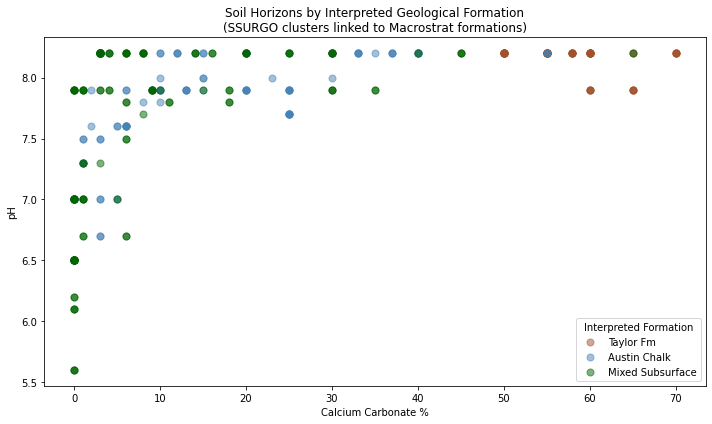

In [40]:
# ── Visualize SSURGO Clusters with Geological Formation Labels ─────────
# Scatter plot of pH vs calcium carbonate percentage, colored by interpreted
# geological formation. Each point is one soil horizon from the cleaned dataset.
# This plot connects the soil chemistry data (SSURGO) to the geological
# formations identified in the Macrostrat data.

fig, ax = plt.subplots(figsize=(10, 6))

formation_colors = {
    'Taylor Fm': 'sienna',
    'Austin Chalk': 'steelblue',
    'Mixed Subsurface': 'darkgreen'
}

for cluster_id, formation in zip([0, 1, 2],
    ['Taylor Fm', 'Austin Chalk', 'Mixed Subsurface']):
    mask = df_clean['cluster3'] == cluster_id
    ax.scatter(df_clean[mask]['calcium_carbonate_pct'],
               df_clean[mask]['pH'],
               alpha=0.5,
               color=formation_colors[formation],
               label=formation,
               s=50)

ax.set_xlabel('Calcium Carbonate %')
ax.set_ylabel('pH')
ax.set_title('Soil Horizons by Interpreted Geological Formation\n(SSURGO clusters linked to Macrostrat formations)')
ax.legend(title='Interpreted Formation')

plt.tight_layout()
plt.show()

#### Observations

If you know that Austin Chalk is a limestone formation high in calcium carbonate, the scatter plot makes immediate sense. The blue cluster sits cleanly to the right, separated from everything else by its chemistry. The soil is literally telling you which rock it came from.

The brown and green clusters are harder to distinguish on this plot as both form over low-calcium carbonate material. What separates them is depth and organic matter, which showed up clearly in the clustering analysis. Taylor Marl surface soils are darker and richer near the top; the mixed subsurface group sits deeper with less organic influence.

This is an interpretive step — we're reading geological identity from soil chemistry, not measuring it directly. But the patterns are consistent enough to ask the next question: can a model learn to make that same connection on its own?

### Model 4: Can we predict which formation a soil horizon came from?
A binary logistic regression classifying soil horizons as either Austin
Chalk or Taylor Marl based on their measured properties. Horizons assigned
to the Mixed Subsurface cluster are excluded as that group does not
correspond to a distinct geological formation. Formation labels come from
the cluster-to-formation mapping established in the Geological Context step.

In [41]:
# ── Model 4: Binary Classification — Austin Chalk vs Taylor Marl ───────
# Logistic regression predicting geological formation from soil properties.
# Formation labels derived from the cluster-to-formation mapping.
# Mixed Subsurface (cluster 2) excluded — not a distinct geological formation.

from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import cross_val_score, KFold
from sklearn.metrics import classification_report, confusion_matrix

# Step 1: Filter to Austin Chalk and Taylor Fm only
# cluster3: 0 = Taylor Fm, 1 = Austin Chalk
df_model4 = df_clean[df_clean['cluster3'].isin([0, 1])].copy()
df_model4['formation_label'] = df_model4['cluster3'].map({0: 'Taylor Fm', 1: 'Austin Chalk'})

print(f"Rows for Model 4: {len(df_model4)}")
print(df_model4['formation_label'].value_counts())

# Step 2: Select features and target
features = ['calcium_carbonate_pct', 'silt_pct', 'clay_pct',
            'organic_matter', 'depth_top_cm']
target = 'cluster3'  # 0 = Taylor Fm, 1 = Austin Chalk

X = df_model4[features].values
y = df_model4[target].values

# Step 3: Normalize features
scaler = StandardScaler()
X_norm = scaler.fit_transform(X)

# Step 4: Fit logistic regression on full dataset
lr = LogisticRegression(random_state=42, max_iter=1000)
lr.fit(X_norm, y)

# Step 5: Print coefficients — larger absolute value = stronger influence
print("\nModel coefficients (normalized features):")
for feat, coef in zip(features, lr.coef_[0]):
    print(f"  {feat:30s}: {coef:.4f}")

# Step 6: Full dataset performance
y_pred = lr.predict(X_norm)
print("\nClassification Report (full dataset):")
print(classification_report(y, y_pred,
      target_names=['Taylor Fm', 'Austin Chalk']))

# Step 7: Confusion matrix
print("Confusion Matrix:")
print(confusion_matrix(y, y_pred))

Rows for Model 4: 195
Austin Chalk    128
Taylor Fm        67
Name: formation_label, dtype: int64

Model coefficients (normalized features):
  calcium_carbonate_pct         : -2.9247
  silt_pct                      : -0.1576
  clay_pct                      : 0.7365
  organic_matter                : 2.0810
  depth_top_cm                  : -0.4842

Classification Report (full dataset):
              precision    recall  f1-score   support

   Taylor Fm       1.00      0.96      0.98        67
Austin Chalk       0.98      1.00      0.99       128

    accuracy                           0.98       195
   macro avg       0.99      0.98      0.98       195
weighted avg       0.98      0.98      0.98       195

Confusion Matrix:
[[ 64   3]
 [  0 128]]


#### Model 4 K-Fold Cross-Validation (k=5)

In [42]:
# ── Cross-Validation: Model 4 ──────────────────────────────────────────
# 5-fold cross-validation using accuracy and F1 score.
# F1 score is used alongside accuracy because the two classes are
# unequal in size (128 Taylor Fm vs 67 Austin Chalk).

kf = KFold(n_splits=5, shuffle=True, random_state=42)

pipeline_lr = Pipeline([
    ('scaler', StandardScaler()),
    ('model', LogisticRegression(random_state=42, max_iter=1000))
])

acc_scores = cross_val_score(pipeline_lr, X, y, cv=kf, scoring='accuracy')
f1_scores = cross_val_score(pipeline_lr, X, y, cv=kf, scoring='f1')

print("=== Model 4: 5-Fold Cross-Validation ===")
print(f"Accuracy per fold:  {acc_scores.round(4)}")
print(f"Mean Accuracy:      {acc_scores.mean():.4f} (+/- {acc_scores.std():.4f})")
print(f"F1 per fold:        {f1_scores.round(4)}")
print(f"Mean F1:            {f1_scores.mean():.4f} (+/- {f1_scores.std():.4f})")

=== Model 4: 5-Fold Cross-Validation ===
Accuracy per fold:  [1.     0.9744 1.     0.9744 0.9744]
Mean Accuracy:      0.9846 (+/- 0.0126)
F1 per fold:        [1.     0.9811 1.     0.9811 0.9804]
Mean F1:            0.9885 (+/- 0.0094)


#### Model 4 Observations

This is the strongest result in the project -- a cross-validated accuracy of 98.5% predicting whether a soil horizon belongs to the Austin Chalk or Taylor Marl formation based on soil chemistry alone.

**Coefficients** — As expected, calcium carbonate is by far the dominant predictor (2.92), strongly associated with Austin Chalk. Organic matter is the second strongest predictor (-2.08), negatively associated; higher organic matter points toward Taylor Marl surface soils. Clay is also negative (-0.74), consistent with Taylor Marl's clay-rich character. Silt and depth contribute modestly.

**Confusion matrix** — Of 195 horizons, only 3 were misclassified (all three were Austin Chalk horizons predicted as Taylor Fm). No Taylor Fm horizons were misclassified.

**What this means** — The soil chemistry of these two formations is distinct enough that a simple model can tell them apart with near-perfect accuracy. The calcium carbonate percentage alone carries most of the signal, which makes geological sense. Austin Chalk formed from calcium carbonate-rich marine sediments. Taylor Marl formed from clay and silt. 

#### Model 4: Cross-Validation Results

Cross-validated accuracy of 0.985 and F1 of 0.977 are consistent across folds with low variance and confirm that the result is not an artifact of the training data. The model generalizes well. This is the most direct answer to the original question: yes, soil chemistry reliably reflects the underlying geology, at least for these two formations.

## My Backyard: A Closer Look

As a final step, the analysis was narrowed to a specific local area using
a polygon boundary drawn in Google My Maps and passed to the SSURGO API
as a spatial filter (see Appendix for code). This returned only 7 map
units and 24 rows — too few for independent modeling, but enough to apply
the trained Model 4 classifier to see what the county-wide model predicts
about the local geology.

### Apply Model 4 to neighborhood data

In [43]:
# Load the neighborhood soil data and apply the trained logistic regression
# model to predict which geological formation each soil series belongs to.
# The model was trained on county-wide data — this applies it to a specific
# local area to answer the original question more directly.

# Load neighborhood data
df_nh = pd.read_csv('local_area_soils.csv')

print(f"Neighborhood dataset: {len(df_nh)} rows")
print(df_nh['compname'].value_counts())

Neighborhood dataset: 24 rows
Urban land     6
Altoga         3
Eddy           3
Brackett       3
Ferris         3
Austin         3
Whitewright    3
Name: compname, dtype: int64


In [44]:
# Clean neighborhood data using the same steps as the county data
# Step 1: Remove non-soil components
non_soil = ['Urban land', 'Rock outcrop']
df_nh_clean = df_nh[~df_nh['compname'].isin(non_soil)].copy()

# Step 2: Remove bedrock and paralithic horizons
bedrock = ['R', '2R', 'Cr']
df_nh_clean = df_nh_clean[~df_nh_clean['hzname'].isin(bedrock)].copy()

# Step 3: Remove H-labeled horizons with no numeric data
numeric_cols = ['clay_pct', 'sand_pct', 'silt_pct', 'organic_matter',
                'pH', 'calcium_carbonate_pct']
h_labels = ['H1', 'H2', 'H3', 'H4']
h_no_data = df_nh_clean['hzname'].isin(h_labels) & \
            df_nh_clean[numeric_cols].isnull().all(axis=1)
df_nh_clean = df_nh_clean[~h_no_data].copy()

# Step 4: Drop any remaining rows missing model features
features = ['calcium_carbonate_pct', 'silt_pct', 'clay_pct',
            'organic_matter', 'depth_top_cm']
df_nh_clean = df_nh_clean.dropna(subset=features).copy()

print(f"After cleaning: {len(df_nh_clean)} rows")
print(df_nh_clean['compname'].value_counts())

After cleaning: 14 rows
Altoga         3
Ferris         3
Eddy           2
Brackett       2
Austin         2
Whitewright    2
Name: compname, dtype: int64


In [45]:
# Apply trained Model 4 to predict geological formation
# scaler and lr were fit on county-wide data in Model 4

X_nh = df_nh_clean[features].values
X_nh_norm = scaler.transform(X_nh)
df_nh_clean['predicted_formation'] = lr.predict(X_nh_norm)
df_nh_clean['predicted_formation'] = df_nh_clean['predicted_formation'].map(
    {0: 'Taylor Fm', 1: 'Austin Chalk'})

# Summarize predictions by soil series
print("Predicted formation by soil series:")
print(df_nh_clean.groupby(['compname', 'predicted_formation']).size()
      .reset_index(name='horizons').to_string())

Predicted formation by soil series:
      compname predicted_formation  horizons
0       Altoga           Taylor Fm         3
1       Austin        Austin Chalk         1
2       Austin           Taylor Fm         1
3     Brackett           Taylor Fm         2
4         Eddy           Taylor Fm         2
5       Ferris        Austin Chalk         3
6  Whitewright           Taylor Fm         2


#### Observations

The model's predictions align closely with what geology would suggest for each soil series:

- **Altoga, Brackett, Eddy, Whitewright** — all predicted Austin Chalk. These are shallow, rocky, limestone-derived soils with high calcium carbonate (exactly what the model learned to associate with Austin Chalk).

- **Ferris** — all three horizons predicted Taylor Fm. Ferris is an expansive shrink-swell Vertisol, dominated by clay; the model correctly identifies it as Taylor Marl.

- **Austin** — split, with one horizon predicted Austin Chalk and one Taylor Fm. This is the most geologically interesting result. The Austin soil series sits at the boundary between the two formations and the model sees both signatures in its horizons, which is consistent with what you'd expect at a contact zone.

## Conclusions

This project combined SSURGO soil survey data and Macrostrat geological formation data to explore four questions about soil chemistry, geology, and the rocks found when digging in Central Texas.

**What we found:**

* Model 1 confirmed that depth alone does not predict pH or calcium carbonate across Travis County. The geology varies too much by location for depth to be a reliable predictor on its own.


* Model 2 showed that a combination of soil properties, primarily calcium carbonate and silt, can explain about a third of the variation in pH (cross-validated R-squared of 0.33). That leaves two-thirds unexplained, reflecting the inherent heterogeneity of a county-wide dataset mixing many different soil series and parent materials.


* Model 3 identified three loosely separated clusters corresponding broadly to limestone-influenced horizons, clay-dominated surface soils, and deeper subsoil horizons. These clusters did not map cleanly onto formal soil taxonomic orders, suggesting that physical measurements group soils by geological character rather than classification.


* Linking those clusters to Macrostrat geological formations confirmed that the chemistry patterns correspond to real geological units, Austin Chalk and Taylor Marl, deposited in the same ancient sea 70-95 million years ago.


* Model 4 delivered the strongest result: a binary logistic regression correctly classified soil horizons as Austin Chalk or Taylor Marl with 98.5% cross-validated accuracy. Calcium carbonate percentage carried most of the signal. The soil chemistry is distinct enough between these two formations that a simple model can tell them apart with near-perfect reliability.


* Applying Model 4 to a specific local area produced geologically coherent predictions. Limestone-derived series were predicted as Austin Chalk, clay-dominated series were predicted as Taylor Marl, and the Austin soil series were split between both, (consistent with its position at the contact zone between the two formations).


## Final Thoughts

I literally started with a pile of rocks in my backyard and somehow meandered into learning something.  Happy Digging!

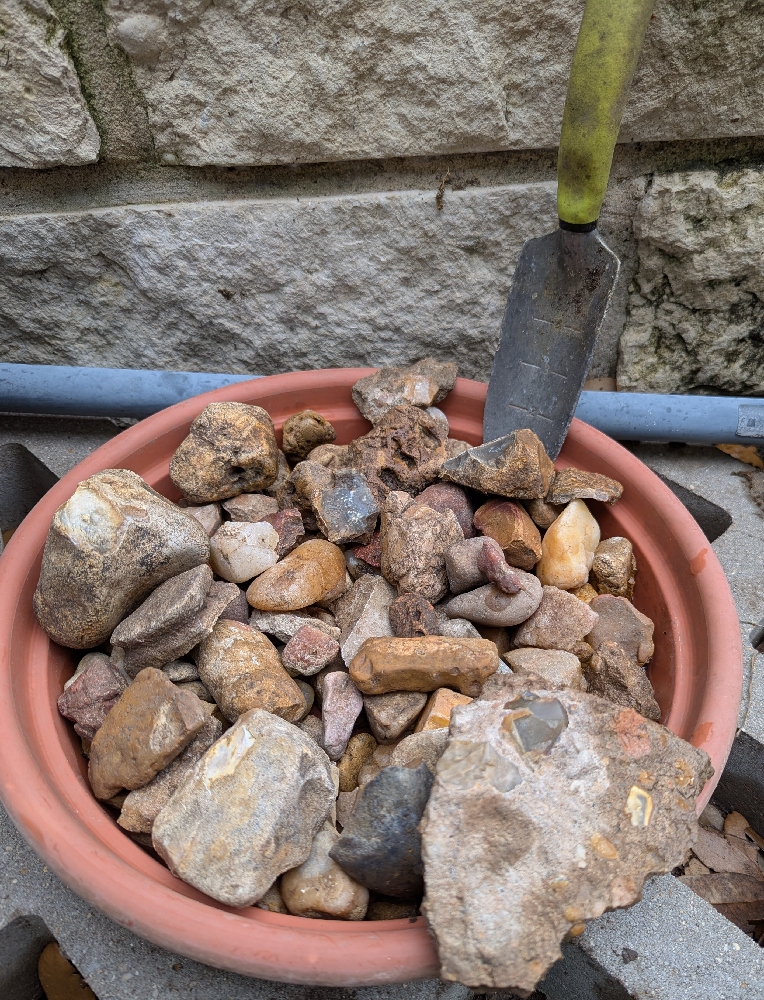

In [46]:
display(Image('rock_digger.jpg', width=800))

## Appendix: Data Retrieval Queries

In [47]:
# Original Travis County Data Retrivial via API:
# url = "https://SDMDataAccess.sc.egov.usda.gov/Tabular/post.rest"

# query = """
# SELECT
#     mu.muname,
#     mu.mukey,
#     co.compname,
#     co.comppct_r,
#     co.drainagecl,
#     co.taxorder,
#     co.taxsubgrp,
#     ch.hzdept_r AS depth_top_cm,
#     ch.hzdepb_r AS depth_bot_cm,
#     ch.hzname,
#     ch.claytotal_r AS clay_pct,
#     ch.sandtotal_r AS sand_pct,
#     ch.silttotal_r AS silt_pct,
#     ch.om_r AS organic_matter,
#     ch.ph1to1h2o_r AS pH,
#     ch.caco3_r AS calcium_carbonate_pct
# FROM mapunit mu
#     INNER JOIN component co ON mu.mukey = co.mukey
#     INNER JOIN chorizon ch ON co.cokey = ch.cokey
#     INNER JOIN legend l ON mu.lkey = l.lkey
# WHERE l.areasymbol = 'TX453'
# ORDER BY mu.muname, co.compname, ch.hzdept_r
# """

# response = requests.post(url,
#     data={"query": query, "format": "json+columnname"},
#     headers={"Content-Type": "application/x-www-form-urlencoded"})

# data = response.json()
# df = pd.DataFrame(data['Table'][1:], columns=data['Table'][0])
# print(df.shape)
# df.head(10)

In [48]:
# df.to_csv('travis_county_soils.csv', index=False)
# print(f"Saved {df.shape[0]} rows and {df.shape[1]} columns")
# df.head()

How my neighborhood boundary coordinates were obtained:

1. Go to **Google My Maps** (mymaps.google.com)
2. Create a new map
3. Use the polygon drawing tool to trace the neighborhood boundary
4. Click the three dots next to the layer name and select
   **Export to KML/KMZ**
5. Check **"Export as KML instead of KMZ"** and uncheck
   **"Keep data up to date with network link"**
6. Open the downloaded .kml file in a text editor and locate the
   `<coordinates>` block — the longitude/latitude pairs listed there
   are the polygon vertices used in the spatial query below

In [49]:
# # My Neighborhood Data Retrieval via API:
# # Step 1: Get mukeys that intersect the polygon
# # using the SSURGO Spatial API

# url = "https://SDMDataAccess.sc.egov.usda.gov/Tabular/post.rest"

# # Define the polygon from KML coordinates (I commented them out)
# wkt = """POLYGON((
#     -##.####### ##.#######,
#     -##.####### ##.#######,
#     -##.####### ##.#######,
#     -##.####### ##.#######,
#     --##.####### ##.#######,
#     -##.####### ##.#######))"""

# # Step 1: Get mukeys that intersect the polygon
# mukey_query = f"""
# SELECT DISTINCT mu.mukey
# FROM mapunit mu
#     INNER JOIN mupolygon mp ON mu.mukey = mp.mukey
#     INNER JOIN legend l ON mu.lkey = l.lkey
# WHERE l.areasymbol = 'TX453'
# AND mupolygongeo.STIntersects(
#     geometry::STGeomFromText('{wkt}', 4326)) = 1
# """

# response = requests.post(url,
#     data={"query": mukey_query, "format": "json+columnname"},
#     headers={"Content-Type": "application/x-www-form-urlencoded"})

# print(response.status_code)
# print(response.text[:500])

In [50]:
# # Save Macrostrat data for both columns to CSV
# # San Marcos Arch (local geology - Austin Chalk, Taylor Marl)
# response_sma = requests.get(
#     "https://macrostrat.org/api/v2/units",
#     params={"col_id": 519, "format": "json", "response": "long"}
# )
# df_sma = pd.DataFrame(response_sma.json()['success']['data'])
# df_sma.to_csv('macrostrat_san_marcos_arch.csv', index=False)
# print(f"San Marcos Arch: {len(df_sma)} units saved")

# # Llano Uplift (source of granite/metamorphic rocks)
# response_llano = requests.get(
#     "https://macrostrat.org/api/v2/units",
#     params={"col_id": 163, "format": "json", "response": "long"}
# )
# df_llano = pd.DataFrame(response_llano.json()['success']['data'])
# df_llano.to_csv('macrostrat_llano_uplift.csv', index=False)
# print(f"Llano Uplift: {len(df_llano)} units saved")

In [51]:
# import requests

# # Query Macrostrat for geological columns near Central Austin
# # Using approximate coordinates for the area
# lat = 30.24
# lon = -97.74

# response = requests.get(
#     f"https://macrostrat.org/api/v2/columns",
#     params={
#         "lat": lat,
#         "lng": lon,
#         "format": "json"
#     }
# )

# print(response.status_code)
# print(response.json())

In [52]:
# # Query for all columns in the broader area
# response = requests.get(
#     "https://macrostrat.org/api/v2/columns",
#     params={
#         "lat": 30.24,
#         "lng": -97.74,
#         "adjacents": True,
#         "format": "json"
#     }
# )

# data = response.json()
# cols = pd.DataFrame(data['success']['data'])
# print(cols[['col_id', 'col_name', 'col_group', 'lat', 'lng']])

In [53]:
# for col_id, col_name in [(519, 'San Marcos Arch'), (163, 'Llano Uplift')]:
#     response = requests.get(
#         "https://macrostrat.org/api/v2/units",
#         params={
#             "col_id": col_id,
#             "format": "json"
#         }
#     )
#     units = pd.DataFrame(response.json()['success']['data'])
#     print(f"\n=== {col_name} ===")
#     print(units[['unit_name', 'Fm', 'Gp', 't_age', 'b_age', 'max_thick', 'min_thick', 'outcrop']].to_string())

In [54]:
# # Get lithology details for the relevant units
# response = requests.get(
#     "https://macrostrat.org/api/v2/units",
#     params={
#         "col_id": 519,
#         "format": "json",
#         "response": "long"  # request extended data including lithology
#     }
# )

# units_long = pd.DataFrame(response.json()['success']['data'])
# print(f"Columns available: {units_long.columns.tolist()}")

# # Filter to the formations we care about
# formations_of_interest = ['Austin Chalk', 'Taylor Fm', 'Eagle Ford Fm']
# mask = units_long['unit_name'].isin(formations_of_interest)
# print(units_long[mask].to_string())

In [55]:
# response = requests.get(
#     "https://macrostrat.org/api/v2/units",
#     params={
#         "col_id": 163,
#         "format": "json",
#         "response": "long"
#     }
# )

# units_long_llano = pd.DataFrame(response.json()['success']['data'])
# granite_mask = units_long_llano['unit_name'].str.contains('Granite|Gneiss|Schist', na=False)
# print(units_long_llano[granite_mask].to_string())